<h1>Dimentsionality Reduction + Clusterng </h1>

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from time import time

from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder

from sklearn.decomposition import PCA
from sklearn.decomposition import FastICA
from sklearn.random_projection import GaussianRandomProjection as GRP
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.feature_selection import SelectFromModel
from scipy.stats import kurtosis

from sklearn.metrics import silhouette_score, davies_bouldin_score, adjusted_rand_score, adjusted_mutual_info_score, homogeneity_score, calinski_harabasz_score, accuracy_score
from sklearn import metrics
from sklearn.mixture import GaussianMixture
from sklearn.cluster import KMeans

from sklearn.neural_network import MLPClassifier
from sklearn.metrics import plot_confusion_matrix,f1_score, confusion_matrix,classification_report,accuracy_score,roc_auc_score,recall_score,mean_squared_error




import plotly.express as px
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from IPython.display import display, HTML, Markdown

from sklearn.cluster import KMeans
from sklearn.datasets import make_blobs

from yellowbrick.cluster import SilhouetteVisualizer
from yellowbrick.cluster import InterclusterDistance
from yellowbrick.cluster import KElbowVisualizer

from sklearn.manifold import TSNE

import warnings
warnings.filterwarnings('ignore')

<h3>Import and Clean Data</h3>

In [2]:
#Heart Data
data = pd.read_csv('../data/heartFailurePrediction/heart.csv', sep=',')

#handling cholestrol 0
data['Cholesterol'] = data['Cholesterol'].replace(0, data['Cholesterol'].mean())

#scale data
# Select numerical variables
data_X = data.drop("HeartDisease", axis=1)
# data_X = data_X.drop("Id", axis=1)
numeric = data_X.select_dtypes(exclude=object).columns
nonnumeric = data_X.select_dtypes(include=object).columns
#numeric.remove('quality')
print(type(numeric))
for col in numeric:
    data_X[col] = StandardScaler().fit_transform(data_X[[col]])

data = data_X.join(data['HeartDisease'])

# Dealing with the outliers (RestingBP)
q1 = data['RestingBP'].quantile(0.25)
q3 = data['RestingBP'].quantile(0.75)
iqr = q3-q1
Lower_tail = q1 - 1.5 * iqr
Upper_tail = q3 + 1.5 * iqr

# Median imputation (RestingBP)
med = np.median(data['RestingBP'])
for i in data['RestingBP']:
    if i > Upper_tail or i < Lower_tail:
            data['RestingBP'] = data['RestingBP'].replace(i, med)

# Dealing with outliers (Cholesterol)
q1 = data['Cholesterol'].quantile(0.25)
q3 = data['Cholesterol'].quantile(0.75)
iqr = q3-q1
Lower_tail = q1 - 1.5 * iqr
Upper_tail = q3 + 1.5 * iqr

# Median imputation (Cholesterol) just on upper tail
med = np.median(data['Cholesterol'])
for i in data['Cholesterol']:
    if i > Upper_tail:
        data['Cholesterol'] = data['Cholesterol'].replace(i, med)

# Select numerical variables
objList = data.select_dtypes(include=object).columns

le = LabelEncoder()
for feat in objList:
    data[feat] = le.fit_transform(data[feat].astype(str))
    

# # #one-hot-encoder

# data_H = pd.get_dummies(data, columns = ['Sex','ChestPainType', 'RestingECG', 'ExerciseAngina','ST_Slope'])
    
#below vars are used.
data_H = data
heartX=data_H.drop("HeartDisease", 1).copy().values
hearty=data_H[["HeartDisease"]]

<class 'pandas.core.indexes.base.Index'>


In [3]:
#Wine Data
data = pd.read_csv('../data/wineQualityDataset/WineQT.csv', sep=',')
#Drop id
data = data.drop("Id", axis=1)
#drop duplicate
data = data.drop_duplicates().reset_index(drop=True)

data = data.drop(data[data.quality == 3].index).reset_index(drop=True)
data = data.drop(data[data.quality == 4].index).reset_index(drop=True)
#data = data.drop(data[data.quality == 8].index).reset_index(drop=True)
data.loc[data["quality"] == 8, "quality"] = 7

#normalize the data
# Select numerical variables
data_X = data.drop("quality", axis=1)
# data_X = data_X.drop("Id", axis=1)
numeric = data_X.select_dtypes(exclude=object).columns
#numeric.remove('quality')
print(type(numeric))
for col in numeric:
    data_X[col] = StandardScaler().fit_transform(data_X[[col]])

data = data_X.join(data['quality'])

#update y values
data.loc[data["quality"] == 5, "quality"] = 0
data.loc[data["quality"] == 6, "quality"] = 1
data.loc[data["quality"] == 7, "quality"] = 2

#below vars are used.
data_W = data
wineX=data_W.drop("quality", 1).copy().values
winey= data_W[["quality"]]

<class 'pandas.core.indexes.base.Index'>


In [4]:
# stratified sampling Heart Disease
from sklearn.model_selection import StratifiedShuffleSplit

print("Splitting StratifiedShuffleSplit into train/test")

split = StratifiedShuffleSplit(n_splits=1 , test_size=0.3, random_state=15)
for train_ind, test_ind in split.split(data_H, data_H["HeartDisease"]):
    train_set = data_H.loc[train_ind]
    test_set = data_H.loc[test_ind]

yH_train = train_set[["HeartDisease"]]
XH_train = train_set.drop("HeartDisease", axis=1)
yH_test = test_set[["HeartDisease"]]
XH_test = test_set.drop("HeartDisease", axis=1)

split = StratifiedShuffleSplit(n_splits=1 , test_size=0.3, random_state=15)
for train_ind, test_ind in split.split(data_W, data_W["quality"]):
    train_set = data_W.loc[train_ind]
    test_set = data_W.loc[test_ind]

yW_train = train_set[["quality"]]
XW_train = train_set.drop("quality", axis=1)
yW_test = test_set[["quality"]]
XW_test = test_set.drop("quality", axis=1)

Splitting StratifiedShuffleSplit into train/test


In [21]:
# reduce heart data set
heartPCA = PCA(n_components=9, random_state=33).fit_transform(XH_train)
heartICA = FastICA(n_components=10, random_state=33).fit_transform(XH_train)
heartRP  = GRP(n_components=10, random_state=33).fit_transform(XH_train)

etc = ExtraTreesClassifier(n_estimators = 100)
etc = etc.fit(XH_train, yH_train)
model = SelectFromModel(etc, prefit=True)
heartET = model.transform(XH_train)
heartET2 = XH_train[['Age','MaxHR','Oldpeak','Sex','ChestPainType', 'RestingECG','ExerciseAngina','ST_Slope']].copy()

# heart_data = []
# heart_data.append(['Original', heartX])
# heart_data.append(['PCA', heartPCA])
# heart_data.append(['ICA', heartICA])
# heart_data.append(['RP',  heartRP])
# heart_data.append(['ETC', heartET])


# reduce wine data set
winePCA = PCA(n_components=9, random_state=33).fit_transform(XW_train)
wineICA = FastICA(n_components=8, random_state=33).fit_transform(XW_train)
wineRP  = GRP(n_components=10, random_state=33).fit_transform(XW_train)

etc = ExtraTreesClassifier(n_estimators = 100)
etc = etc.fit(XW_train, yW_train)
model = SelectFromModel(etc, prefit=True)
wineET = model.transform(XW_train)

# wine_data = []
# wine_data.append(['Original', wineX])
# wine_data.append(['PCA', winePCA])
# wine_data.append(['ICA', wineICA])
# wine_data.append(['RP',  wineRP])
# wine_data.append(['ETC', wineET])

<h3>Helper Methods</h3>

In [22]:
# elbow method and silhouette score (kmeans plot showing)
def kmeans_k_selection_plots(title, data):
    inertia = []
    s_scores = []
    db_scores = []
    ch_score = []
    clusters = range(2,16)
    for i in clusters:
        kmeans = KMeans(n_clusters=i,init='k-means++', random_state=42)
        kmeans.fit(data)
        inertia.append(kmeans.inertia_)
        
        k_y = kmeans.predict(data)
        s_scores.append(silhouette_score(data, k_y))
        db_scores.append(davies_bouldin_score(data, k_y))
        ch_score.append(calinski_harabasz_score(data, k_y))
                
            
    # Plot the data
    _, axes = plt.subplots(1, 4, figsize=(28, 7))
    
    axes[0].set_title(title + " - K-mean Inertia")
    axes[0].set_xlabel("Clusters")
    axes[0].set_ylabel("K-mean Inertia")
    axes[0].set_xticks(clusters)
    axes[0].grid()
    axes[0].plot(clusters, inertia, '-o')
    
    axes[1].set_title(title + " - Silhouette Score")
    axes[1].set_xlabel("Clusters")
    axes[1].set_ylabel("Silhouette Score")
    axes[1].set_xticks(clusters)
    axes[1].grid()
    axes[1].plot(clusters, s_scores, '-o')
   
    axes[2].set_title(title + " - Davies Bouldin Score")
    axes[2].set_xlabel("Clusters")
    axes[2].set_ylabel("Davies Bouldin Score")
    axes[2].set_xticks(clusters)
    axes[2].grid()
    axes[2].plot(clusters, db_scores, '-o')

    axes[3].set_title(title + " - CH Score")
    axes[3].set_xlabel("Clusters")
    axes[3].set_ylabel("calinski_harabasz_score score")
    axes[3].set_xticks(clusters)
    axes[3].grid()
    axes[3].plot(clusters, ch_score, '-o')

    plt.show()

# aic, bic and silhouette plots (expectation maximization)
def em_k_selection_plot(title, data):
    aic = []
    bic = []
    s_scores = []
    log_likelihood = []
    clusters = range(2,15)
    for i in clusters:
        
        gmm = GaussianMixture(n_components=i, random_state=42)
        gmm.fit(data)
        
        gmm_labels = gmm.predict(data)

        s_scores.append(silhouette_score(data, gmm_labels))
        aic.append(gmm.aic(data))
        bic.append(gmm.bic(data))
        log_likelihood.append(gmm.score(data))
                
    # Plot the data
    _, axes = plt.subplots(1, 4, figsize=(28, 7))
    
    axes[0].set_title(title + " - AIC Score")
    axes[0].set_xlabel("Clusters")
    axes[0].set_ylabel("AIC Score")
    axes[0].set_xticks(clusters)
    axes[0].grid()
    axes[0].plot(clusters, aic, '-o')
    
    axes[1].set_title(title + " - BIC Score")
    axes[1].set_xlabel("Clusters")
    axes[1].set_ylabel("BIC Score")
    axes[1].set_xticks(clusters)
    axes[1].grid()
    axes[1].plot(clusters, bic, '-o')
   
    axes[2].set_title(title + " - LL Score")
    axes[2].set_xlabel("Clusters")
    axes[2].set_ylabel("Log Likelihood score")
    axes[2].set_xticks(clusters)
    axes[2].grid()
    axes[2].plot(clusters, log_likelihood, '-o')
    
    axes[3].set_title(title + " - Silhouette Score")
    axes[3].set_xlabel("Clusters")
    axes[3].set_ylabel("Silhouette Score")
    axes[3].set_xticks(clusters)
    axes[3].grid()
    axes[3].plot(clusters, s_scores, '-o')

    plt.show()
    
def em_k_selection_plot_2(title, data):    
    n_components = np.arange(1, 21)
    models = [GaussianMixture(n, covariance_type='full', random_state=42).fit(data)
              for n in n_components]

    plt.plot(n_components, [m.bic(data) for m in models], label='BIC')
    plt.plot(n_components, [m.aic(data) for m in models], label='AIC')
    plt.title(title + " - AIC-BIC together", fontsize=20)
    plt.legend(loc='best')
    plt.xlabel('n_components')
    plt.show()
    
from sklearn.cluster import MeanShift, estimate_bandwidth

# using MeanShift to get an estimate
def meanshift_cluster(title, data):
    bandwidth = estimate_bandwidth(data, 
                               quantile=0.3, 
                               n_jobs=-1)
    ms = MeanShift(bandwidth=bandwidth, 
               bin_seeding=False, 
               n_jobs=-1, 
               max_iter=500)
    ms.fit(data)
    labels = ms.labels_
    cluster_centers = ms.cluster_centers_
    labels_unique = np.unique(labels)
    n_clusters_ = len(labels_unique)
    print(f"Number of estimated clusters for {title}: {n_clusters_}")
    
    
#https://towardsdatascience.com/selecting-optimal-k-for-k-means-clustering-c7579fd2e926
def model_report_multiclass(model,
                            X_train,
                            y_train,
                            X_test,
                            y_test,
                            show_train_report=True,
                            show_test_report=True,
                            fitted_model=False,
                            cmap=['cool', 'copper_r'],
                            normalize='true',
                            figsize=(15, 5)):
    """
    Dispalys model report of multiclass classification model.
    Report of model performance using train-test split dataset.
    Shows train and test score, Confusion Matrix and, ROC Curve of performane of test data. 
    Uses sklearn and yellowbrick for plotting.
    
    Parameters:
    -----------
    model : object, scikit-learn model object; no default.
    X_train : pandas.DataFrame, predictor variable training data split; no default,
    y_train : pandas.DataFrame, target variable training data split; no default,
    X_test : pandas.DataFrame, predictor variable test data split; no default,
    y_test : pandas.DataFrame, target variable test data split; no default,
    cmap : {NOT IMPLIMENTED} list of str, colormap of Confusion Matrix; default: ['cool', 'copper_r'],
        cmap of train and test data
    normalize : {NOT IMPLIMENTED} str, normalize count of Confusion Matrix; default: 'true',
        - `true` to normalize counts.
        - `false` to show raw counts.
    figsize : tuple ``(lenght, height) in inchs``, figsize of output; default: (16, 6),
    show_train_report : boolean; default: False,
        - True, to show report.
        - False, to turn off report.
    fitted_model : bool; default: False,
        - if True, fits model to train data and generates report.
        - if False, does not fits model and generates report.
        Use False for previously fitted model.
    ---version 0.9.14---
    """
    if fitted_model is False:
        model.fit(X_train, y_train)
    train = model.score(X_train, y_train)
    test = model.score(X_test, y_test)

    def str_model_(model):
        """Helper function to get model class display statement, this text conversion breaks code if 
        performed in ``model_report`` function's local space. This function is to isolate from the 
        previous function's local space."""
        str_model = str(model.__class__).split('.')[-1][:-2]
        display(
            HTML(
                f"""<strong>Report of {str_model} type model using train-test split dataset.</strong>"""
            ))

    str_model_(model)
    print(f"{'*'*90}")
    print(f"""Train accuracy score: {train.round(4)}""")
    print(f"""Test accuracy score: {test.round(4)}""")
    if abs(train - test) <= .05:
        print(
            f"    No over or underfitting detected, diffrence of scores did not cross 5% thresh hold."
        )
    elif (train - test) > .05:
        print(
            f"    Possible Overfitting, diffrence of scores {round(abs(train-test)*100,2)}% crossed 5% thresh hold."
        )
    elif (train - test) < -.05:
        print(
            f"    Possible Underfitting, diffrence of scores {round(abs(train-test)*100,2)}% crossed 5% thresh hold."
        )
    print(f"{'*'*90}")
    print("")
    
    
def get_Dumy_classifierReport(cluster_df):
    X_feat_imp = cluster_df.drop(columns='Clusters').copy()
    y_feat_imp = cluster_df.Clusters.copy()
    X_feat_imp_train, X_feat_imp_test, y_feat_imp_train, y_feat_imp_test = train_test_split(
        X_feat_imp, y_feat_imp, train_size=.8)
    # Random Forest
    clf_rf = RandomForestClassifier(
        n_jobs=-1,
        criterion='entropy',
        min_samples_leaf=5,
        min_samples_split=6,
        class_weight='balanced_subsample',
    )
    model_report_multiclass(clf_rf,
                           X_feat_imp_train,
                           y_feat_imp_train,
                           X_feat_imp_test,
                           y_feat_imp_test,
                           show_train_report=True)
def SelBest(arr:list, X:int)->list:
    '''
    returns the set of X configurations with shorter distance
    '''
    dx=np.argsort(arr)[:X]
    return arr[dx]

def gmm_js(gmm_p, gmm_q, n_samples=10**5):
    # https://towardsdatascience.com/gaussian-mixture-model-clusterization-how-to-select-the-number-of-components-clusters-553bef45f6e4
    
    X = gmm_p.sample(n_samples)[0]
    log_p_X = gmm_p.score_samples(X)
    log_q_X = gmm_q.score_samples(X)
    log_mix_X = np.logaddexp(log_p_X, log_q_X)

    Y = gmm_q.sample(n_samples)[0]
    log_p_Y = gmm_p.score_samples(Y)
    log_q_Y = gmm_q.score_samples(Y)
    log_mix_Y = np.logaddexp(log_p_Y, log_q_Y)

    return np.sqrt((log_p_X.mean() - (log_mix_X.mean() - np.log(2))
            + log_q_Y.mean() - (log_mix_Y.mean() - np.log(2))) / 2)

def generate_kmeans_SV_ICD_plots(X, k):
    plot_nums = len(k)
    fig, axes = plt.subplots(plot_nums, 2, figsize=[15, 40])
    col_ = 0
    for i in k:
        kmeans = KMeans(n_clusters=i, algorithm="full")
        visualizer = SilhouetteVisualizer(kmeans, colors='yellowbrick', ax=axes[col_][0])
        visualizer.fit(X)
        visualizer.finalize()
        
        kmeans = KMeans(n_clusters=i, algorithm="full")
        visualizer = InterclusterDistance(kmeans, ax=axes[col_][1])
        visualizer.fit(X)
        visualizer.finalize()
        
        col_+=1
    plt.show()
    


def generate_EM_SV_ICD_plots(X, k):
    plot_nums = len(k)
    fig, axes = plt.subplots(plot_nums, 2, figsize=[25, 40])
    col_ = 0
    for i in k:
        GMM = GaussianMixture(n_components=i,n_init=2,
                              tol=1e-3,
                              max_iter=1000)
        visualizer = SilhouetteVisualizer(GaussianMixture, colors='yellowbrick', ax=axes[col_][0])
        visualizer.fit(X)
        visualizer.finalize()
        
        GMM = GaussianMixture(n_components=i,n_init=2,
                              tol=1e-3,
                              max_iter=1000)
        visualizer = InterclusterDistance(GMM, ax=axes[col_][1])
        visualizer.fit(X)
        visualizer.finalize()
        
        col_+=1
    plt.show()
    
def generate_distance_bw_gmms_plots(X, n):
    # https://towardsdatascience.com/gaussian-mixture-model-clusterization-how-to-select-the-number-of-components-clusters-553bef45f6e4
    
    n_clusters=np.arange(2, n)
    iterations=n
    results=[]
    res_sigs=[]
    for n in n_clusters:
        dist=[]

        for iteration in range(iterations):
            train, test=train_test_split(X, test_size=0.5)

            gmm_train=GaussianMixture(n, n_init=2).fit(train) 
            gmm_test=GaussianMixture(n, n_init=2).fit(test) 
            dist.append(gmm_js(gmm_train, gmm_test))
        selec=SelBest(np.array(dist), int(iterations/5))
        result=np.mean(selec)
        res_sig=np.std(selec)
        results.append(result)
        res_sigs.append(res_sig)


    plt.errorbar(n_clusters, results, yerr=res_sigs)
    plt.title("Distance between Train and Test GMMs", fontsize=20)
    plt.xticks(n_clusters)
    plt.xlabel("N. of components")
    plt.ylabel("Distance")
    plt.show()
    
def dummy_NN_RecallScore_train(X,y):
    clf_nn = MLPClassifier(random_state=42)
    start_time = time()
    clf_nn.fit(X, y)
    
    end_time = time()- start_time
    print('Train Time: %.3f seconds' % end_time)
    start_time = time()
    y_pred = clf_nn.predict(X)
    end_time = time()- start_time
    print('Test Time: %.3f seconds' % end_time)
    nn_accuracy = recall_score(y, y_pred)
    print('Recall Score of NN is %.2f%%' % (nn_accuracy * 100))
    
def dummy_NN_f1Score_train(X,y):
    clf_nn = MLPClassifier(random_state=42)
    start_time = time()
    clf_nn.fit(X, y)
    
    end_time = time()- start_time
    print('Train Time: %.3f seconds' % end_time)
    start_time = time()
    y_pred = clf_nn.predict(X)
    end_time = time()- start_time
    print('Test Time: %.3f seconds' % end_time)
    nn_accuracy = f1_score(y, y_pred, average='micro')
    print('f1_micro Score of NN is %.2f%%' % (nn_accuracy * 100))

In [23]:
from sklearn.manifold import TSNE
import pandas as pd
import seaborn as sns

def Tsne_plot(X,y,p):
# We want to get TSNE embedding with 2 dimensions
    n_components = 2
    tsne = TSNE(n_components, random_state=33, perplexity=p)
    tsne_result = tsne.fit_transform(X)
    tsne_result.shape
# (1000, 2)
# Two dimensions for each of our images
 
# Plot the result of our TSNE with the label color coded
# A lot of the stuff here is about making the plot look pretty and not TSNE
    tsne_result_df = pd.DataFrame({'tsne_1': tsne_result[:,0], 'tsne_2': tsne_result[:,1], 'label': y})
    fig, ax = plt.subplots(1)
    sns.scatterplot(x='tsne_1', y='tsne_2', hue='label', data=tsne_result_df, ax=ax,s=120)
    lim = (tsne_result.min()-5, tsne_result.max()+5)
    ax.set_xlim(lim)
    ax.set_ylim(lim)
    ax.set_aspect('equal')
    ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.0)

    

In [24]:

# code based on example found at:
# https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_digits.html#sphx-glr-auto-examples-cluster-plot-kmeans-digits-py
def bench_kmeans(estimator, labels, name, data):
    t0 = time()
    estimator.fit(data)
    print('%-9s\t%.2fs\t%i\t%.3f\t%.3f\t%.3f\t%.3f\t%.3f\t%.3f'
          % (name, (time() - t0), estimator.inertia_,
             metrics.homogeneity_score(labels.values.ravel(), estimator.labels_),
             metrics.completeness_score(labels.values.ravel(), estimator.labels_),
             metrics.v_measure_score(labels.values.ravel(), estimator.labels_),
             metrics.adjusted_rand_score(labels.values.ravel(), estimator.labels_),
             metrics.adjusted_mutual_info_score(labels.values.ravel(),  estimator.labels_),
             metrics.silhouette_score(data, estimator.labels_, metric='euclidean')))
   
def bench_em(estimator, labels, name, data):
    t0 = time()
    estimator.fit(data)
    gmm_labels = estimator.predict(data)
    print('%-9s\t%.2fs\t%i\t%i\t%.3f\t%.3f\t%.3f\t%.3f\t%.3f\t%.3f'
          % (name, (time() - t0), estimator.aic(data), estimator.bic(data),
             metrics.homogeneity_score(labels.values.ravel(), gmm_labels),
             metrics.completeness_score(labels.values.ravel(), gmm_labels),
             metrics.v_measure_score(labels.values.ravel(), gmm_labels),
             metrics.adjusted_rand_score(labels.values.ravel(), gmm_labels),
             metrics.adjusted_mutual_info_score(labels.values.ravel(),  gmm_labels),
             metrics.silhouette_score(data, gmm_labels, metric='euclidean')))
    


<p>Reduced datasets</p>

<h3> Heart Dataset </h3>

-------------- Heart PCA -----------
-------------- K-Means -----------


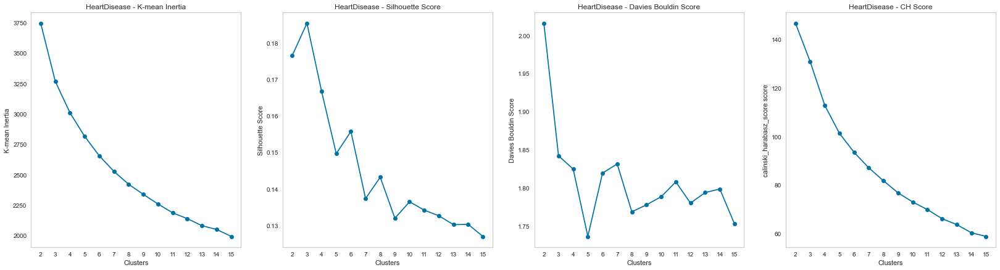

Number of estimated clusters for HeartDisease: 1


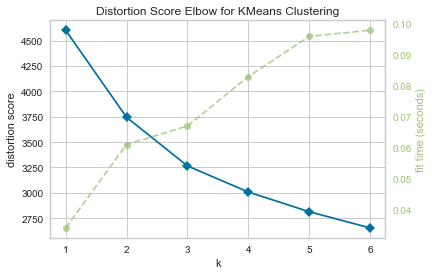

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [7]:
print("-------------- Heart PCA -----------")
print("-------------- K-Means -----------")
kmeans_k_selection_plots('HeartDisease', heartPCA)
meanshift_cluster('HeartDisease', heartPCA)

# Instantiate the clustering model and visualizer
model = KMeans()
visualizer = KElbowVisualizer(model, k=(1,7))

visualizer.fit(heartPCA)        # Fit the data to the visualizer
visualizer.show() 




<Figure size 360x432 with 0 Axes>

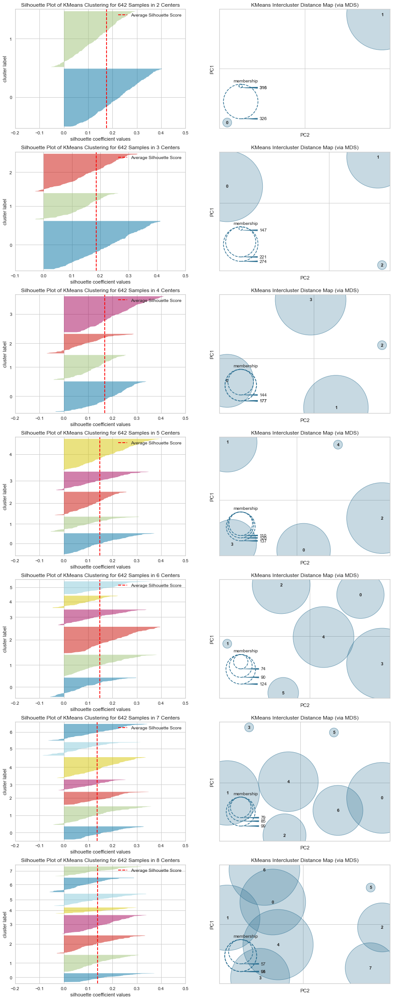

In [8]:

k = list(range(2,9))
plt.figure(figsize=(5,6))
generate_kmeans_SV_ICD_plots(heartPCA, k)

In [152]:
# Kmeans HeartDataset
# setting number of cluster to 5. overfits and 3 works
n_clusters=2
kmeans = KMeans(
    init='k-means++',
    algorithm='auto',
    n_clusters=n_clusters,
    max_iter=1000,
    random_state=1,  # selecting random_state=1 for reproducibility
    verbose=0).fit(heartPCA)

# using prediction to create a dataframe
clusters = kmeans.predict(heartPCA)
cluster_df = pd.DataFrame(heartPCA).copy()
cluster_df['Clusters'] = clusters
cluster_df

# distribution of classes (%)
(cluster_df.Clusters.value_counts(1)*100).round(2)



0    50.93
1    49.07
Name: Clusters, dtype: float64

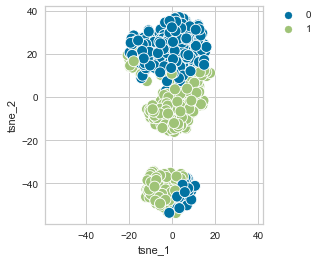

In [153]:
Tsne_plot(heartPCA,clusters,33)

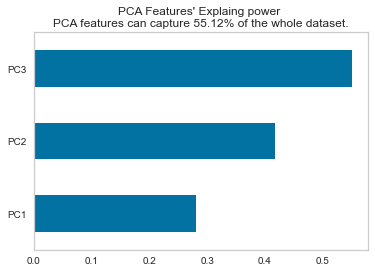

In [154]:
pca = PCA(n_components=3)
pc_feature_names = [f"PC{x}" for x in range(1, pca.n_components + 1)]
pca_data = pca.fit_transform(cluster_df)
pca_df = pd.DataFrame(pca_data, columns=pc_feature_names)
pd.Series(pca.explained_variance_ratio_.cumsum(), index=pc_feature_names).plot(
    kind='barh',
    title=
    f"""PCA Features' Explaing power \nPCA features can capture {((pca.explained_variance_ratio_.cumsum()[-1])*100).round(2)}% of the whole dataset."""
)
plt.grid()
plt.show()
heart_pca_kmeans= pca_df
pca_df['Clusters'] = clusters.astype('str')
fig = px.scatter_3d(pca_df,
                    x='PC1',
                    y='PC2',
                    z='PC3',
                    color='Clusters',
                    title='Cluster visualization with the help of PCA',
                    template='plotly_dark')
fig.update_traces(marker=dict(size=2))
fig.update_layout(width=700, height=500, bargap=0.05)
fig.show()

In [11]:
get_Dumy_classifierReport(cluster_df)

******************************************************************************************
Train accuracy score: 0.9961
Test accuracy score: 0.9767
    No over or underfitting detected, diffrence of scores did not cross 5% thresh hold.
******************************************************************************************



In [147]:
# Kmeans HeartDataset
km_3 = KMeans(n_clusters=2,
                    init="k-means++",
                    random_state=42).fit(heartPCA)

km_3_pred = km_3.predict(heartPCA)
print("Adjusted Rand Score:     ", adjusted_rand_score(km_3_pred, yH_train.values.ravel()))
print("Homogeneity Score:       ", homogeneity_score(km_3_pred, yH_train.values.ravel()))
print("accuracy Score:       ", accuracy_score(km_3_pred, yH_train.values.ravel()))
print("adjusted_mutual_info Score:       ", adjusted_mutual_info_score(km_3_pred, yH_train.values.ravel()))
print("Calinski Harabasz Score: ", calinski_harabasz_score(heartPCA, km_3_pred))

Adjusted Rand Score:      0.3311152823216693
Homogeneity Score:        0.261882775304918
accuracy Score:        0.2118380062305296
adjusted_mutual_info Score:        0.2620811650731913
Calinski Harabasz Score:  146.73252693441364


In [12]:
print( '------ Baseline Dummy -----')
dummy_NN_RecallScore_train(XH_train, yH_train)
print( '------ Heart PCA K-means Dummy -----')
dummy_NN_RecallScore_train(heart_pca_kmeans, yH_train)

------ Baseline Dummy -----
Train Time: 0.827 seconds
Test Time: 0.002 seconds
Recall Score of NN is 93.52%
------ Heart PCA K-means Dummy -----
Train Time: 0.845 seconds
Test Time: 0.002 seconds
Recall Score of NN is 79.44%


-------------- EM -----------


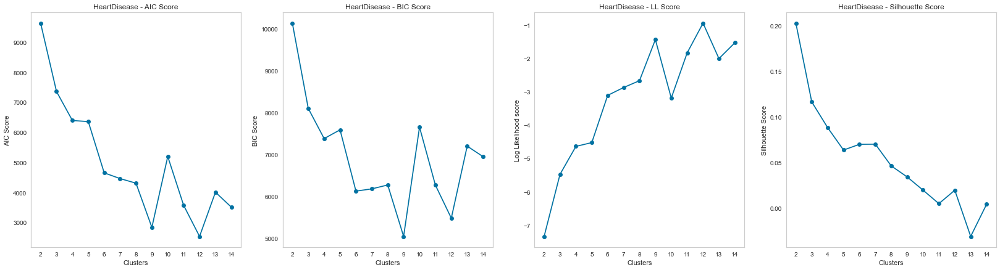

In [13]:
print("-------------- EM -----------")
em_k_selection_plot('HeartDisease', heartPCA)

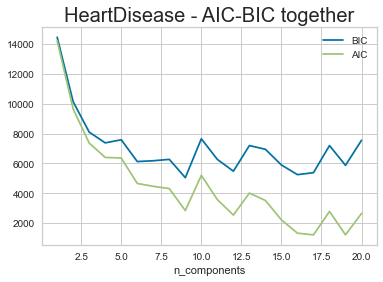

In [14]:
em_k_selection_plot_2('HeartDisease', heartPCA)

In [123]:
# EM HeartDataset
# setting number of cluster to 5. overfits and 3 works
n_c=9
gmm_h_pred = GaussianMixture(n_components=n_c,
                              n_init=2,
                              tol=1e-3,
                              max_iter=1000, random_state=42).fit(heartPCA)
clusters = gmm_h_pred.predict(heartPCA)

cluster_df = pd.DataFrame(heartPCA).copy()
cluster_df['Clusters'] = clusters
cluster_df

# distribution of classes (%)
(cluster_df.Clusters.value_counts(1)*100).round(2)

0    23.68
7    22.59
4    15.42
8    11.99
2     8.72
3     8.26
1     4.05
5     3.58
6     1.71
Name: Clusters, dtype: float64

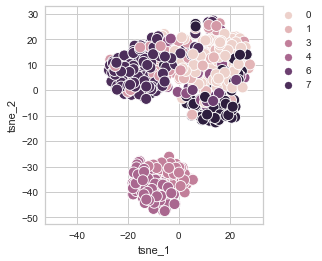

In [124]:
Tsne_plot(heartPCA,clusters)

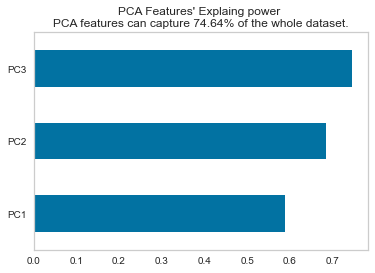

In [16]:
pca = PCA(n_components=3)
pc_feature_names = [f"PC{x}" for x in range(1, pca.n_components + 1)]
pca_data = pca.fit_transform(cluster_df)
pca_df = pd.DataFrame(pca_data, columns=pc_feature_names)
pd.Series(pca.explained_variance_ratio_.cumsum(), index=pc_feature_names).plot(
    kind='barh',
    title=
    f"""PCA Features' Explaing power \nPCA features can capture {((pca.explained_variance_ratio_.cumsum()[-1])*100).round(2)}% of the whole dataset."""
)
plt.grid()
plt.show()

heart_pca_em = pca_df
pca_df['Clusters'] = clusters.astype('str')
fig = px.scatter_3d(pca_df,
                    x='PC1',
                    y='PC2',
                    z='PC3',
                    color='Clusters',
                    title='Cluster visualization with the help of PCA',
                    template='plotly_dark')
fig.update_traces(marker=dict(size=2))
fig.update_layout(width=700, height=500, bargap=0.05)
fig.show()

In [17]:
get_Dumy_classifierReport(cluster_df)

******************************************************************************************
Train accuracy score: 0.9493
Test accuracy score: 0.8527
    Possible Overfitting, diffrence of scores 9.66% crossed 5% thresh hold.
******************************************************************************************



In [18]:
print( '------ Baseline Dummy -----')
dummy_NN_RecallScore_train(XH_train, yH_train)
print( '------ Heart PCA EM Dummy -----')
dummy_NN_RecallScore_train(heart_pca_em, yH_train)

------ Baseline Dummy -----
Train Time: 0.906 seconds
Test Time: 0.003 seconds
Recall Score of NN is 93.52%
------ Heart PCA EM Dummy -----
Train Time: 0.792 seconds
Test Time: 0.002 seconds
Recall Score of NN is 86.20%


In [202]:
# EM HeartDataset
gmm_h_pred = GaussianMixture(n_components=7,
                              n_init=2,
                              tol=1e-3,
                              max_iter=1000, random_state=42).fit(heartPCA)
gmm_h_pred_vals = gmm_h_pred.predict(heartPCA)

print("Adjusted Rand Score      ", adjusted_rand_score(gmm_h_pred_vals, yH_train.values.ravel()))
print("Homogeneity Score:       ", homogeneity_score(gmm_h_pred_vals, yH_train.values.ravel()))
print("accuracy Score:       ", accuracy_score(gmm_h_pred_vals, yH_train.values.ravel()))
print("adjusted_mutual_info Score:       ", adjusted_mutual_info_score(gmm_h_pred_vals, yH_train.values.ravel()))
print("Calinski Harabasz Score: ", calinski_harabasz_score(heartPCA, gmm_h_pred_vals))

Adjusted Rand Score       0.20253537197739985
Homogeneity Score:        0.15663152360756644
accuracy Score:        0.235202492211838
adjusted_mutual_info Score:        0.22219020819607668
Calinski Harabasz Score:  57.440542237121


<p> Heart PCA, KNN = 2, EM= 7 </p>

<h1> ICA HeartDiseacse Clustering</h1>

-------------- Heart ICA -----------
-------------- K-Means -----------


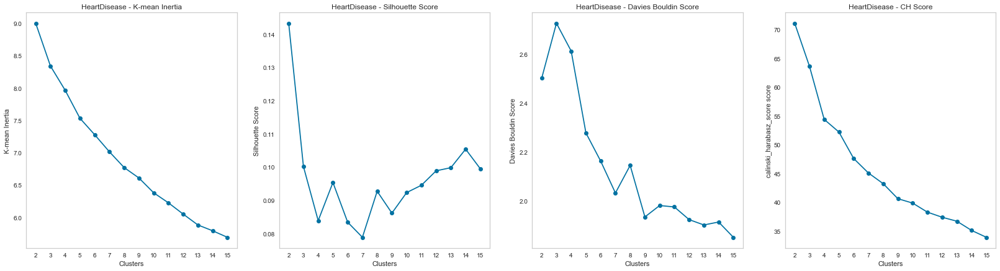

Number of estimated clusters for HeartDisease: 1


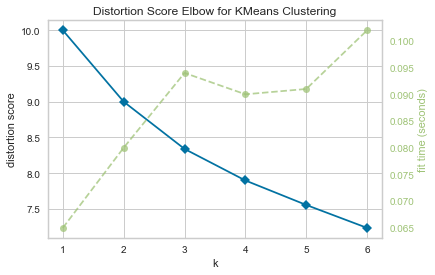

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [156]:
print("-------------- Heart ICA -----------")
print("-------------- K-Means -----------")
kmeans_k_selection_plots('HeartDisease', heartICA)
meanshift_cluster('HeartDisease', heartICA)

# Instantiate the clustering model and visualizer
model = KMeans()
visualizer = KElbowVisualizer(model, k=(1,7))

visualizer.fit(heartICA)        # Fit the data to the visualizer
visualizer.show() 


<Figure size 360x432 with 0 Axes>

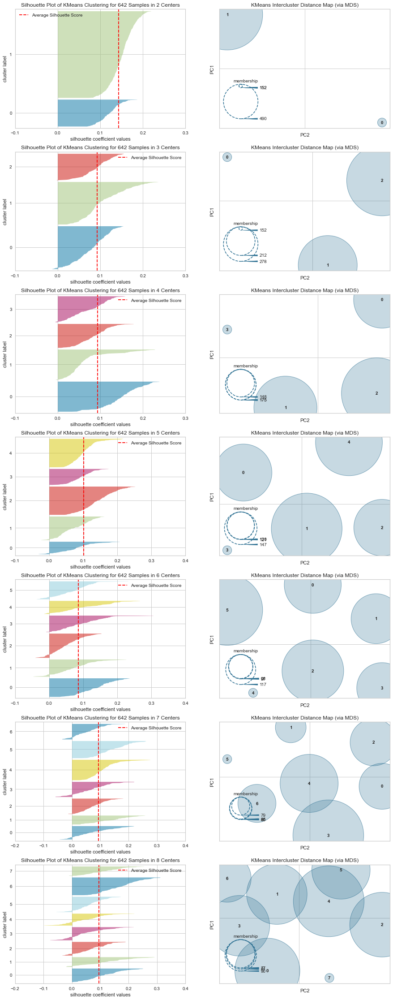

In [157]:
k = list(range(2,9))
plt.figure(figsize=(5,6))
generate_kmeans_SV_ICD_plots(heartICA, k)

In [164]:
# Kmeans HeartDataset
# setting number of cluster to 5. overfits and 3 works
n_clusters=3
kmeans = KMeans(
    init='k-means++',
    algorithm='auto',
    n_clusters=n_clusters,
    max_iter=1000,
    random_state=1,  # selecting random_state=1 for reproducibility
    verbose=0).fit(heartICA)

# using prediction to create a dataframe
clusters = kmeans.predict(heartICA)
cluster_df = pd.DataFrame(heartICA).copy()
cluster_df['Clusters'] = clusters
cluster_df

# distribution of classes (%)
(cluster_df.Clusters.value_counts(1)*100).round(2)

0    38.94
1    37.38
2    23.68
Name: Clusters, dtype: float64

In [171]:
30

30

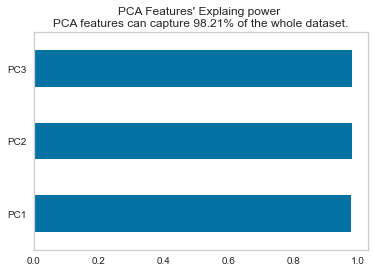

******************************************************************************************
Train accuracy score: 0.9961
Test accuracy score: 0.969
    No over or underfitting detected, diffrence of scores did not cross 5% thresh hold.
******************************************************************************************



In [172]:
pca = PCA(n_components=3)
pc_feature_names = [f"PC{x}" for x in range(1, pca.n_components + 1)]
pca_data = pca.fit_transform(cluster_df)
pca_df = pd.DataFrame(pca_data, columns=pc_feature_names)
pd.Series(pca.explained_variance_ratio_.cumsum(), index=pc_feature_names).plot(
    kind='barh',
    title=
    f"""PCA Features' Explaing power \nPCA features can capture {((pca.explained_variance_ratio_.cumsum()[-1])*100).round(2)}% of the whole dataset."""
)
plt.grid()
plt.show()
heart_ica_kmeans= pca_df
pca_df['Clusters'] = clusters.astype('str')
fig = px.scatter_3d(pca_df,
                    x='PC1',
                    y='PC2',
                    z='PC3',
                    color='Clusters',
                    title='Cluster visualization with the help of PCA',
                    template='plotly_dark')
fig.update_traces(marker=dict(size=2))
fig.update_layout(width=700, height=500, bargap=0.05)
fig.show()

get_Dumy_classifierReport(cluster_df)

In [173]:
print( '------ Baseline Dummy -----')
dummy_NN_RecallScore_train(XH_train, yH_train)
print( '------ Heart PCA K-means Dummy -----')
dummy_NN_RecallScore_train(heart_ica_kmeans, yH_train)

------ Baseline Dummy -----
Train Time: 0.943 seconds
Test Time: 0.003 seconds
Recall Score of NN is 93.52%
------ Heart PCA K-means Dummy -----
Train Time: 0.837 seconds
Test Time: 0.002 seconds
Recall Score of NN is 88.73%


In [179]:
# Kmeans HeartDataset
km_3 = KMeans(n_clusters=3,
                    init="k-means++",
                    random_state=42).fit(heartICA)

km_3_pred = km_3.predict(heartICA)
print("Adjusted Rand Score:     ", adjusted_rand_score(km_3_pred, yH_train.values.ravel()))
print("Homogeneity Score:       ", homogeneity_score(km_3_pred, yH_train.values.ravel()))
print("accuracy Score:       ", accuracy_score(km_3_pred, yH_train.values.ravel()))
print("adjusted_mutual_info Score:       ", adjusted_mutual_info_score(km_3_pred, yH_train.values.ravel()))
print("Calinski Harabasz Score: ", calinski_harabasz_score(heartICA, km_3_pred))

Adjusted Rand Score:      0.24578140645418925
Homogeneity Score:        0.17859034844940022
accuracy Score:        0.5
adjusted_mutual_info Score:        0.21655748735925132
Calinski Harabasz Score:  63.63022451884177


-------------- EM -----------


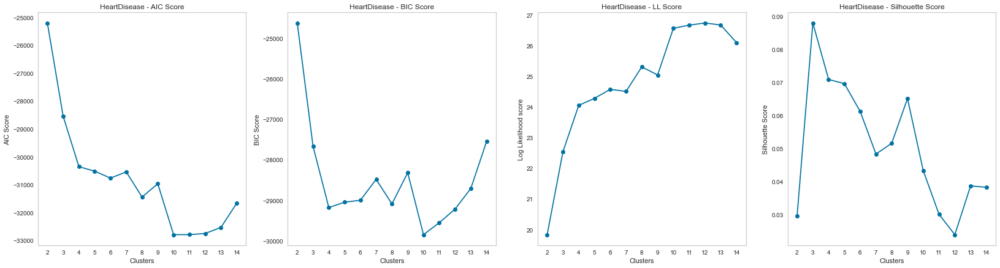

In [180]:
print("-------------- EM -----------")
em_k_selection_plot('HeartDisease', heartICA)

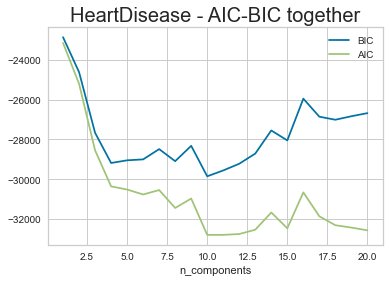

In [181]:
em_k_selection_plot_2('HeartDisease', heartICA)

In [191]:
# EM HeartDataset
# setting number of cluster to 5. overfits and 3 works
n_c=2
gmm_h_pred = GaussianMixture(n_components=n_c,
                              n_init=2,
                              tol=1e-3,
                              max_iter=1000, random_state=42).fit(heartICA)
clusters = gmm_h_pred.predict(heartICA)

cluster_df = pd.DataFrame(heartICA).copy()
cluster_df['Clusters'] = clusters
cluster_df

# distribution of classes (%)
(cluster_df.Clusters.value_counts(1)*100).round(2)

1    73.52
0    26.48
Name: Clusters, dtype: float64

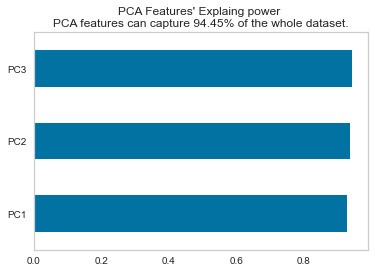

In [192]:
pca = PCA(n_components=3)
pc_feature_names = [f"PC{x}" for x in range(1, pca.n_components + 1)]
pca_data = pca.fit_transform(cluster_df)
pca_df = pd.DataFrame(pca_data, columns=pc_feature_names)
pd.Series(pca.explained_variance_ratio_.cumsum(), index=pc_feature_names).plot(
    kind='barh',
    title=
    f"""PCA Features' Explaing power \nPCA features can capture {((pca.explained_variance_ratio_.cumsum()[-1])*100).round(2)}% of the whole dataset."""
)
plt.grid()
plt.show()

heart_ica_em = pca_df
pca_df['Clusters'] = clusters.astype('str')
fig = px.scatter_3d(pca_df,
                    x='PC1',
                    y='PC2',
                    z='PC3',
                    color='Clusters',
                    title='Cluster visualization with the help of PCA',
                    template='plotly_dark')
fig.update_traces(marker=dict(size=2))
fig.update_layout(width=700, height=500, bargap=0.05)
fig.show()

In [193]:
print( '------ Baseline Dummy -----')
dummy_NN_RecallScore_train(XH_train, yH_train)
print( '------ Heart PCA EM Dummy -----')
dummy_NN_RecallScore_train(heart_ica_em, yH_train)

------ Baseline Dummy -----
Train Time: 0.955 seconds
Test Time: 0.002 seconds
Recall Score of NN is 93.52%
------ Heart PCA EM Dummy -----
Train Time: 0.527 seconds
Test Time: 0.002 seconds
Recall Score of NN is 96.34%


In [194]:
# EM HeartDataset
gmm_h_pred = GaussianMixture(n_components=2,
                              n_init=2,
                              tol=1e-3,
                              max_iter=1000, random_state=42).fit(heartICA)
gmm_h_pred_vals = gmm_h_pred.predict(heartICA)

print("Adjusted Rand Score      ", adjusted_rand_score(gmm_h_pred_vals, yH_train.values.ravel()))
print("Homogeneity Score:       ", homogeneity_score(gmm_h_pred_vals, yH_train.values.ravel()))
print("accuracy Score:       ", accuracy_score(gmm_h_pred_vals, yH_train.values.ravel()))
print("adjusted_mutual_info Score:       ", adjusted_mutual_info_score(gmm_h_pred_vals, yH_train.values.ravel()))
print("Calinski Harabasz Score: ", calinski_harabasz_score(heartICA, gmm_h_pred_vals))

Adjusted Rand Score       0.30492879396642847
Homogeneity Score:        0.3171027403245936
accuracy Score:        0.7772585669781932
adjusted_mutual_info Score:        0.2887844820688872
Calinski Harabasz Score:  34.489035968142005


<h1> RCA HeartDiseacse Clustering</h1>

<p> Heart ICA, KNN = 3, EM= 2 </p>

-------------- Heart RP -----------
-------------- K-Means -----------


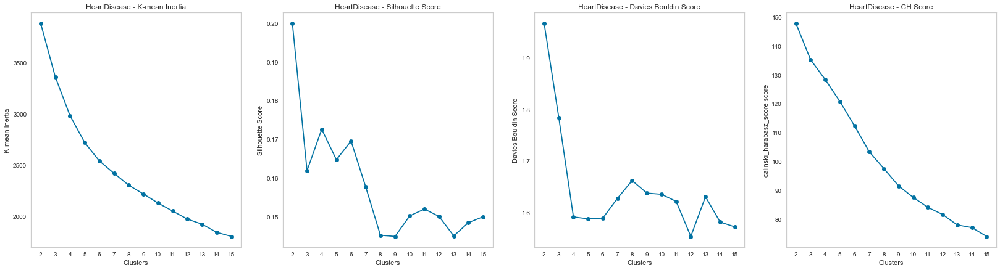

Number of estimated clusters for HeartDisease: 1


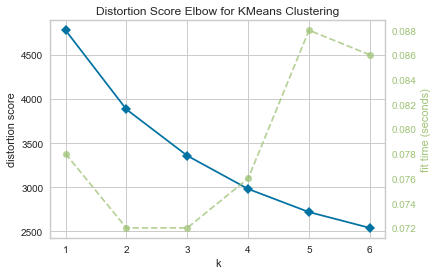

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [204]:
print("-------------- Heart RP -----------")
print("-------------- K-Means -----------")
kmeans_k_selection_plots('HeartDisease', heartRP)
meanshift_cluster('HeartDisease', heartRP)

# Instantiate the clustering model and visualizer
model = KMeans()
visualizer = KElbowVisualizer(model, k=(1,7))

visualizer.fit(heartRP)        # Fit the data to the visualizer
visualizer.show() 



<Figure size 360x432 with 0 Axes>

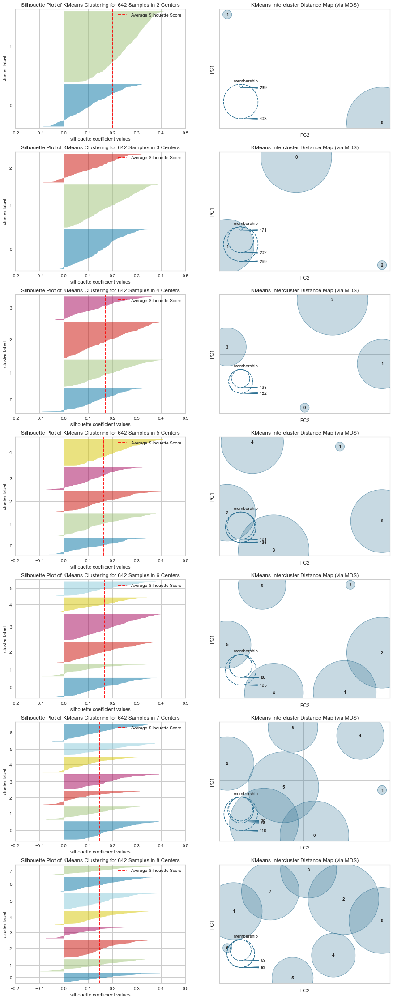

In [205]:
k = list(range(2,9))
plt.figure(figsize=(5,6))
generate_kmeans_SV_ICD_plots(heartRP, k)

In [206]:
# Kmeans HeartDataset
# setting number of cluster to 5. overfits and 3 works
n_clusters=4
kmeans = KMeans(
    init='k-means++',
    algorithm='auto',
    n_clusters=n_clusters,
    max_iter=1000,
    random_state=1,  # selecting random_state=1 for reproducibility
    verbose=0).fit(heartRP)

# using prediction to create a dataframe
clusters = kmeans.predict(heartRP)
cluster_df = pd.DataFrame(heartRP).copy()
cluster_df['Clusters'] = clusters
cluster_df

# distribution of classes (%)
(cluster_df.Clusters.value_counts(1)*100).round(2)

0    33.18
2    24.77
3    21.34
1    20.72
Name: Clusters, dtype: float64

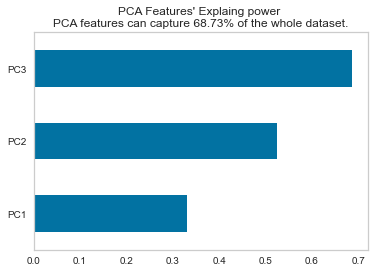

******************************************************************************************
Train accuracy score: 0.9844
Test accuracy score: 0.938
    No over or underfitting detected, diffrence of scores did not cross 5% thresh hold.
******************************************************************************************



In [207]:
pca = PCA(n_components=3)
pc_feature_names = [f"PC{x}" for x in range(1, pca.n_components + 1)]
pca_data = pca.fit_transform(cluster_df)
pca_df = pd.DataFrame(pca_data, columns=pc_feature_names)
pd.Series(pca.explained_variance_ratio_.cumsum(), index=pc_feature_names).plot(
    kind='barh',
    title=
    f"""PCA Features' Explaing power \nPCA features can capture {((pca.explained_variance_ratio_.cumsum()[-1])*100).round(2)}% of the whole dataset."""
)
plt.grid()
plt.show()
heart_rca_kmeans= pca_df
pca_df['Clusters'] = clusters.astype('str')
fig = px.scatter_3d(pca_df,
                    x='PC1',
                    y='PC2',
                    z='PC3',
                    color='Clusters',
                    title='Cluster visualization with the help of PCA',
                    template='plotly_dark')
fig.update_traces(marker=dict(size=2))
fig.update_layout(width=700, height=500, bargap=0.05)
fig.show()

get_Dumy_classifierReport(cluster_df)

In [208]:
print( '------ Baseline Dummy -----')
dummy_NN_RecallScore_train(XH_train, yH_train)
print( '------ Heart PCA K-means Dummy -----')
dummy_NN_RecallScore_train(heart_rca_kmeans, yH_train)

------ Baseline Dummy -----
Train Time: 0.966 seconds
Test Time: 0.003 seconds
Recall Score of NN is 93.52%
------ Heart PCA K-means Dummy -----
Train Time: 0.974 seconds
Test Time: 0.003 seconds
Recall Score of NN is 81.41%


In [213]:
# Kmeans HeartDataset
km_3 = KMeans(n_clusters=4,
                    init="k-means++",
                    random_state=42).fit(heartRP)

km_3_pred = km_3.predict(heartRP)
print("Adjusted Rand Score:     ", adjusted_rand_score(km_3_pred, yH_train.values.ravel()))
print("Homogeneity Score:       ", homogeneity_score(km_3_pred, yH_train.values.ravel()))
print("accuracy Score:       ", accuracy_score(km_3_pred, yH_train.values.ravel()))
print("adjusted_mutual_info Score:       ", adjusted_mutual_info_score(km_3_pred, yH_train.values.ravel()))
print("Calinski Harabasz Score: ", calinski_harabasz_score(heartRP, km_3_pred))

Adjusted Rand Score:      0.04219529513045919
Homogeneity Score:        0.04113860373574264
accuracy Score:        0.18847352024922118
adjusted_mutual_info Score:        0.052398309094149303
Calinski Harabasz Score:  128.34490702584696


-------------- EM -----------


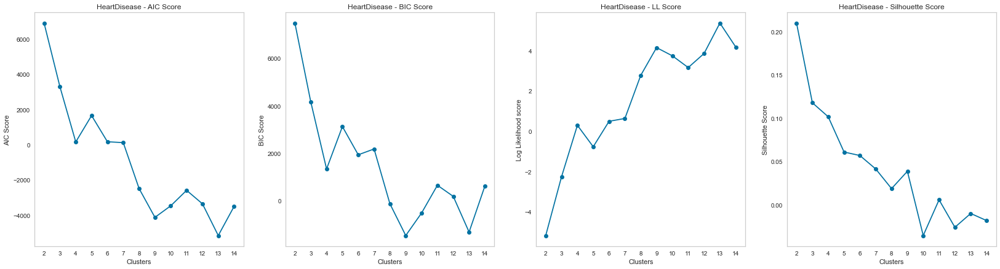

In [216]:
print("-------------- EM -----------")
em_k_selection_plot('HeartDisease', heartRP)

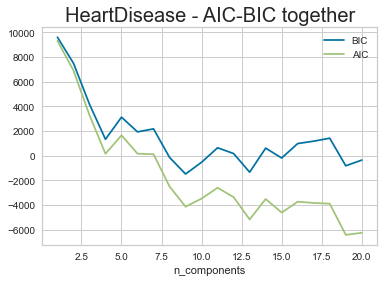

In [217]:
em_k_selection_plot_2('HeartDisease', heartRP)

In [227]:
# EM HeartDataset
# setting number of cluster to 5. overfits and 3 works
n_c=4
gmm_h_pred = GaussianMixture(n_components=n_c,
                              n_init=2,
                              tol=1e-3,
                              max_iter=1000, random_state=42).fit(heartRP)
clusters = gmm_h_pred.predict(heartRP)

cluster_df = pd.DataFrame(heartRP).copy()
cluster_df['Clusters'] = clusters
cluster_df

# distribution of classes (%)
(cluster_df.Clusters.value_counts(1)*100).round(2)

2    26.95
1    25.70
3    23.68
0    23.68
Name: Clusters, dtype: float64

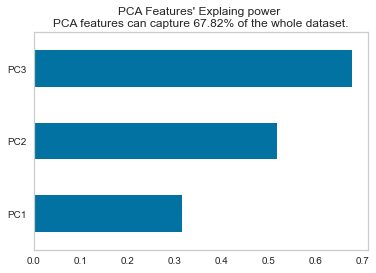

In [228]:
pca = PCA(n_components=3)
pc_feature_names = [f"PC{x}" for x in range(1, pca.n_components + 1)]
pca_data = pca.fit_transform(cluster_df)
pca_df = pd.DataFrame(pca_data, columns=pc_feature_names)
pd.Series(pca.explained_variance_ratio_.cumsum(), index=pc_feature_names).plot(
    kind='barh',
    title=
    f"""PCA Features' Explaing power \nPCA features can capture {((pca.explained_variance_ratio_.cumsum()[-1])*100).round(2)}% of the whole dataset."""
)
plt.grid()
plt.show()

heart_rca_em = pca_df
pca_df['Clusters'] = clusters.astype('str')
fig = px.scatter_3d(pca_df,
                    x='PC1',
                    y='PC2',
                    z='PC3',
                    color='Clusters',
                    title='Cluster visualization with the help of PCA',
                    template='plotly_dark')
fig.update_traces(marker=dict(size=2))
fig.update_layout(width=700, height=500, bargap=0.05)
fig.show()

In [38]:
print( '------ Baseline Dummy -----')
dummy_NN_RecallScore_train(XH_train, yH_train)
print( '------ Heart PCA EM Dummy -----')
dummy_NN_RecallScore_train(heart_rca_em, yH_train)

------ Baseline Dummy -----
Train Time: 0.831 seconds
Test Time: 0.002 seconds
Recall Score of NN is 93.52%
------ Heart PCA EM Dummy -----
Train Time: 0.811 seconds
Test Time: 0.003 seconds
Recall Score of NN is 88.73%


In [226]:
# EM HeartDataset
gmm_h_pred = GaussianMixture(n_components=4,
                              n_init=2,
                              tol=1e-3,
                              max_iter=1000, random_state=42).fit(heartRP)
gmm_h_pred_vals = gmm_h_pred.predict(heartRP)

print("Adjusted Rand Score      ", adjusted_rand_score(gmm_h_pred_vals, yH_train.values.ravel()))
print("Homogeneity Score:       ", homogeneity_score(gmm_h_pred_vals, yH_train.values.ravel()))
print("accuracy Score:       ", accuracy_score(gmm_h_pred_vals, yH_train.values.ravel()))
print("adjusted_mutual_info Score:       ", adjusted_mutual_info_score(gmm_h_pred_vals, yH_train.values.ravel()))
print("Calinski Harabasz Score: ", calinski_harabasz_score(heartRP, gmm_h_pred_vals))

Adjusted Rand Score       0.18997109164168702
Homogeneity Score:        0.15959284578037103
accuracy Score:        0.16355140186915887
adjusted_mutual_info Score:        0.21150280368601257
Calinski Harabasz Score:  78.52978530261356


<p> Heart RP, KNN = 4, EM= 4 </p>

<h2> ETC clustering</h1>

-------------- Heart ETC -----------
-------------- K-Means -----------


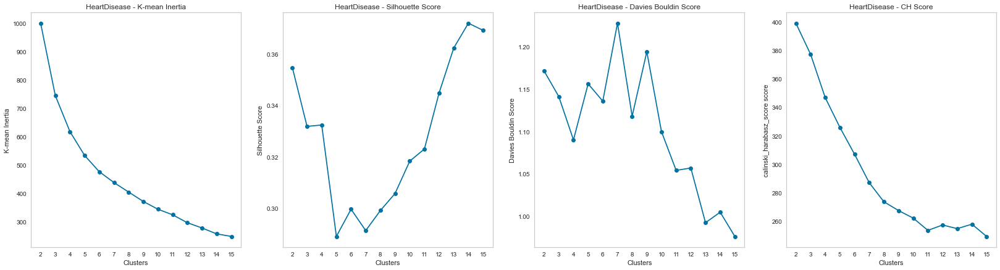

Number of estimated clusters for HeartDisease: 2


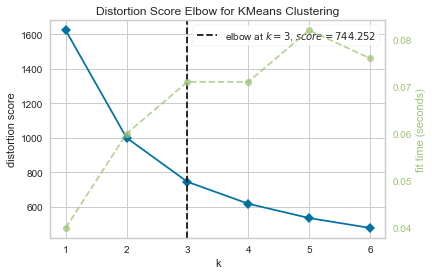

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [25]:
print("-------------- Heart ETC -----------")
print("-------------- K-Means -----------")
kmeans_k_selection_plots('HeartDisease', heartET)

meanshift_cluster('HeartDisease', heartET)

# Instantiate the clustering model and visualizer
model = KMeans()
visualizer = KElbowVisualizer(model, k=(1,7))

visualizer.fit(heartET)        # Fit the data to the visualizer
visualizer.show() 


<Figure size 360x432 with 0 Axes>

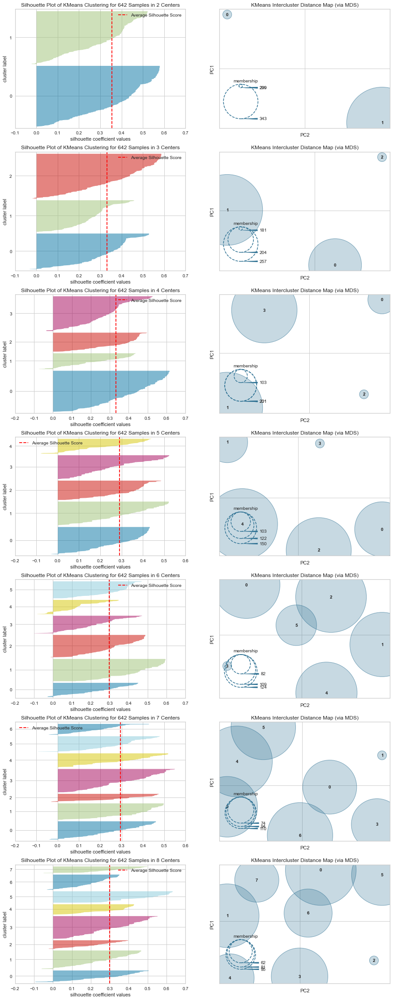

In [26]:
k = list(range(2,9))
plt.figure(figsize=(5,6))
generate_kmeans_SV_ICD_plots(heartET, k)

In [27]:
# Kmeans HeartDataset
# setting number of cluster to 5. overfits and 3 works
n_clusters=4
kmeans = KMeans(
    init='k-means++',
    algorithm='auto',
    n_clusters=n_clusters,
    max_iter=1000,
    random_state=1,  # selecting random_state=1 for reproducibility
    verbose=0).fit(heartET)

# using prediction to create a dataframe
clusters = kmeans.predict(heartET)
cluster_df = pd.DataFrame(heartET).copy()
cluster_df['Clusters'] = clusters
cluster_df

# distribution of classes (%)
(cluster_df.Clusters.value_counts(1)*100).round(2)

2    37.23
1    30.37
3    16.82
0    15.58
Name: Clusters, dtype: float64

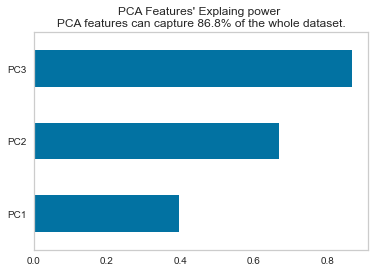

******************************************************************************************
Train accuracy score: 0.9766
Test accuracy score: 0.938
    No over or underfitting detected, diffrence of scores did not cross 5% thresh hold.
******************************************************************************************



In [28]:
pca = PCA(n_components=3)
pc_feature_names = [f"PC{x}" for x in range(1, pca.n_components + 1)]
pca_data = pca.fit_transform(cluster_df)
pca_df = pd.DataFrame(pca_data, columns=pc_feature_names)
pd.Series(pca.explained_variance_ratio_.cumsum(), index=pc_feature_names).plot(
    kind='barh',
    title=
    f"""PCA Features' Explaing power \nPCA features can capture {((pca.explained_variance_ratio_.cumsum()[-1])*100).round(2)}% of the whole dataset."""
)
plt.grid()
plt.show()
heart_etc_kmeans= pca_df
pca_df['Clusters'] = clusters.astype('str')
fig = px.scatter_3d(pca_df,
                    x='PC1',
                    y='PC2',
                    z='PC3',
                    color='Clusters',
                    title='Cluster visualization with the help of PCA',
                    template='plotly_dark')
fig.update_traces(marker=dict(size=2))
fig.update_layout(width=700, height=500, bargap=0.05)
fig.show()

get_Dumy_classifierReport(cluster_df)

In [29]:
print( '------ Baseline Dummy -----')
dummy_NN_RecallScore_train(XH_train, yH_train)
print( '------ Heart PCA K-means Dummy -----')
dummy_NN_RecallScore_train(heart_etc_kmeans, yH_train)

------ Baseline Dummy -----
Train Time: 0.852 seconds
Test Time: 0.002 seconds
Recall Score of NN is 93.52%
------ Heart PCA K-means Dummy -----
Train Time: 0.843 seconds
Test Time: 0.003 seconds
Recall Score of NN is 83.38%


-------------- EM -----------


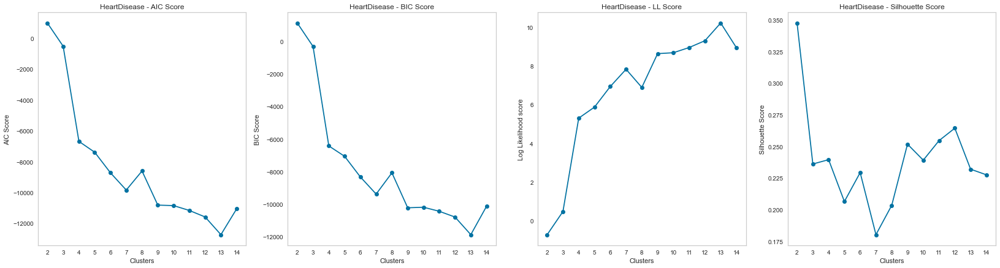

In [30]:

print("-------------- EM -----------")
em_k_selection_plot('HeartDisease', heartET)

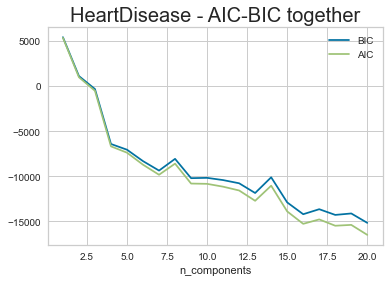

In [31]:
em_k_selection_plot_2('HeartDisease', heartET)

In [32]:
# EM HeartDataset
# setting number of cluster to 5. overfits and 3 works
n_c=7
gmm_h_pred = GaussianMixture(n_components=n_c,
                              n_init=2,
                              tol=1e-3,
                              max_iter=1000, random_state=42).fit(heartET)
clusters = gmm_h_pred.predict(heartET)

cluster_df = pd.DataFrame(heartET).copy()
cluster_df['Clusters'] = clusters
cluster_df

# distribution of classes (%)
(cluster_df.Clusters.value_counts(1)*100).round(2)

3    36.45
4    32.09
2    10.28
6     8.88
0     8.88
5     2.49
1     0.93
Name: Clusters, dtype: float64

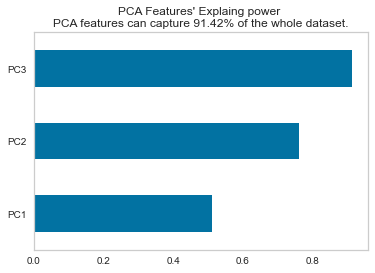

In [33]:
pca = PCA(n_components=3)
pc_feature_names = [f"PC{x}" for x in range(1, pca.n_components + 1)]
pca_data = pca.fit_transform(cluster_df)
pca_df = pd.DataFrame(pca_data, columns=pc_feature_names)
pd.Series(pca.explained_variance_ratio_.cumsum(), index=pc_feature_names).plot(
    kind='barh',
    title=
    f"""PCA Features' Explaing power \nPCA features can capture {((pca.explained_variance_ratio_.cumsum()[-1])*100).round(2)}% of the whole dataset."""
)
plt.grid()
plt.show()

heart_etc_em = pca_df
pca_df['Clusters'] = clusters.astype('str')
fig = px.scatter_3d(pca_df,
                    x='PC1',
                    y='PC2',
                    z='PC3',
                    color='Clusters',
                    title='Cluster visualization with the help of PCA',
                    template='plotly_dark')
fig.update_traces(marker=dict(size=2))
fig.update_layout(width=700, height=500, bargap=0.05)
fig.show()

In [34]:
print( '------ Baseline Dummy -----')
dummy_NN_RecallScore_train(XH_train, yH_train)
print( '------ Heart PCA EM Dummy -----')
dummy_NN_RecallScore_train(heart_etc_em, yH_train)

------ Baseline Dummy -----
Train Time: 0.848 seconds
Test Time: 0.002 seconds
Recall Score of NN is 93.52%
------ Heart PCA EM Dummy -----
Train Time: 0.781 seconds
Test Time: 0.003 seconds
Recall Score of NN is 87.04%


<p> Heart ETC, KNN = 4, EM= 4 </p>

In [37]:
# Create k-means benchmark table
# print_line('K-Means Wine Benchmark')
print('init\t\ttime\tinertia\thomog\tcompl\tv-meas\tARI\tAMI\tsilhouette')
print(85*'_')
bench_kmeans(KMeans(init='k-means++', n_clusters=2), labels=yH_train, name="Original",  data=XH_train)
bench_kmeans(KMeans(init='k-means++', n_clusters=2), labels=yH_train, name="PCA-based", data=heartPCA)
bench_kmeans(KMeans(init='k-means++', n_clusters=3), labels=yH_train, name="ICA-based", data=heartICA)
bench_kmeans(KMeans(init='k-means++', n_clusters=4), labels=yH_train, name="RP-based",  data=heartRP)
bench_kmeans(KMeans(init='k-means++', n_clusters=4), labels=yH_train, name="ETC-based", data=heartET)
# Create EM benchmark table
# print_line('EM Wine Benchmark')
print('init\t\ttime\taic\tbic\thomog\tcompl\tv-meas\tARI\tAMI\tsilhouette')
print(85*'_')
bench_em(GaussianMixture(n_components=3, random_state=33), labels=yH_train, name="Original",  data=XH_train)
bench_em(GaussianMixture(n_components=8, random_state=33), labels=yH_train, name="PCA-based", data=heartPCA)
bench_em(GaussianMixture(n_components=3, random_state=33), labels=yH_train, name="ICA-based", data=heartICA)
bench_em(GaussianMixture(n_components=4, random_state=33), labels=yH_train, name="RP-based",  data=heartRP)
bench_em(GaussianMixture(n_components=7, random_state=33), labels=yH_train, name="ETC-based", data=heartET)

init		time	inertia	homog	compl	v-meas	ARI	AMI	silhouette
_____________________________________________________________________________________
Original 	0.07s	3935	0.250	0.248	0.249	0.317	0.248	0.169
PCA-based	0.06s	3744	0.264	0.262	0.263	0.331	0.262	0.177
ICA-based	0.07s	8	0.280	0.179	0.218	0.246	0.217	0.100
RP-based 	0.08s	2981	0.087	0.044	0.058	0.047	0.056	0.172
ETC-based	0.06s	616	0.222	0.116	0.152	0.182	0.150	0.332
init		time	aic	bic	homog	compl	v-meas	ARI	AMI	silhouette
_____________________________________________________________________________________
Original 	0.04s	801	1841	0.220	0.143	0.173	0.189	0.172	0.136
PCA-based	0.11s	4320	6280	0.403	0.152	0.221	0.181	0.217	0.048
ICA-based	0.06s	-26783	-25903	0.362	0.235	0.285	0.327	0.284	0.051
RP-based 	0.06s	614	1788	0.245	0.140	0.178	0.197	0.176	0.124
ETC-based	0.10s	-9420	-8956	0.373	0.163	0.227	0.272	0.223	0.191


In [38]:
df2 = pd.DataFrame()
df2['init'] = ['Original','PCA-based','ICA-based','RP-based','ETC-based']
df2['time'] = [0.07,0.06,0.07,0.08,0.06]
df2['inertia'] = [3935,3744,8,2981,616]
df2['homog'] = [0.25,0.264,0.28,0.087,0.222]
df2['compl'] = [0.248,0.262,0.179,0.044,0.116]
df2['v-meas'] = [0.249,0.263,0.218,0.058,0.152]
df2['ARI'] = [0.317,0.331,0.246,0.047,0.182]
df2['AMI'] = [0.248,0.262,0.217,0.056,0.15]
df2['silhouette'] = [0.169,0.177,0.1,0.172,0.332]

cm = sns.light_palette('green', as_cmap='True')
s = df2.style.background_gradient(cmap=cm)
s

,init,time,inertia,homog,compl,v-meas,ARI,AMI,silhouette
0,Original,0.070000,3935,0.250000,0.248000,0.249000,0.317000,0.248000,0.169000
1,PCA-based,0.060000,3744,0.264000,0.262000,0.263000,0.331000,0.262000,0.177000
2,ICA-based,0.070000,8,0.280000,0.179000,0.218000,0.246000,0.217000,0.100000
3,RP-based,0.080000,2981,0.087000,0.044000,0.058000,0.047000,0.056000,0.172000
4,ETC-based,0.060000,616,0.222000,0.116000,0.152000,0.182000,0.150000,0.332000


In [40]:
df2 = pd.DataFrame()

df2['init'] = ['Original','PCA-based','ICA-based','RP-based','ETC-based']
df2['time'] = [0.04,0.11,0.06,0.06,0.10]
df2['aic'] = [801,4320,-26783,614,-9420]
df2['bic'] = [1841,6280,-25903,1788,-8956]
df2['homog'] = [0.22,0.403,0.362,0.245,0.373]
df2['compl'] = [0.143,0.152,0.235,0.14,0.163]
df2['v-meas'] = [0.173,0.221,0.285,0.178,0.227]
df2['ARI'] = [0.189,0.181,0.327,0.197,0.272]
df2['AMI'] = [0.172,0.217,0.284,0.176,0.223]

cm = sns.light_palette('green', as_cmap='True')
s = df2.style.background_gradient(cmap=cm)
s

,init,time,aic,bic,homog,compl,v-meas,ARI,AMI
0,Original,0.040000,801,1841,0.220000,0.143000,0.173000,0.189000,0.172000
1,PCA-based,0.110000,4320,6280,0.403000,0.152000,0.221000,0.181000,0.217000
2,ICA-based,0.060000,-26783,-25903,0.362000,0.235000,0.285000,0.327000,0.284000
3,RP-based,0.060000,614,1788,0.245000,0.140000,0.178000,0.197000,0.176000
4,ETC-based,0.100000,-9420,-8956,0.373000,0.163000,0.227000,0.272000,0.223000


<h3>Wine Dataset</h3>

-------------- Wine PCA -----------
-------------- K-Means -----------


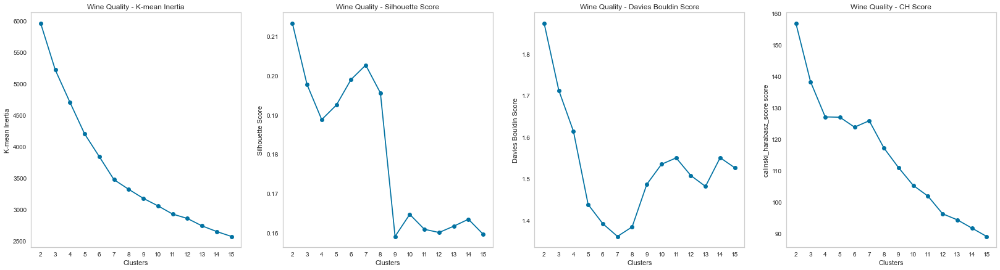

Number of estimated clusters for Wine Quality: 7


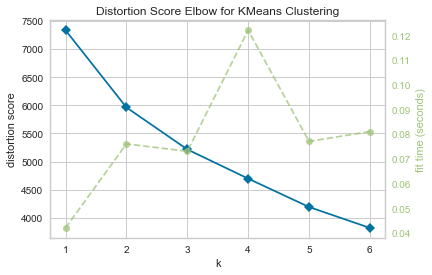

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [8]:
print("-------------- Wine PCA -----------")
print("-------------- K-Means -----------")
kmeans_k_selection_plots('Wine Quality', winePCA)

meanshift_cluster('Wine Quality', winePCA)

# Instantiate the clustering model and visualizer
model = KMeans()
visualizer = KElbowVisualizer(model, k=(1,7))

visualizer.fit(winePCA)        # Fit the data to the visualizer
visualizer.show() 


<Figure size 360x432 with 0 Axes>

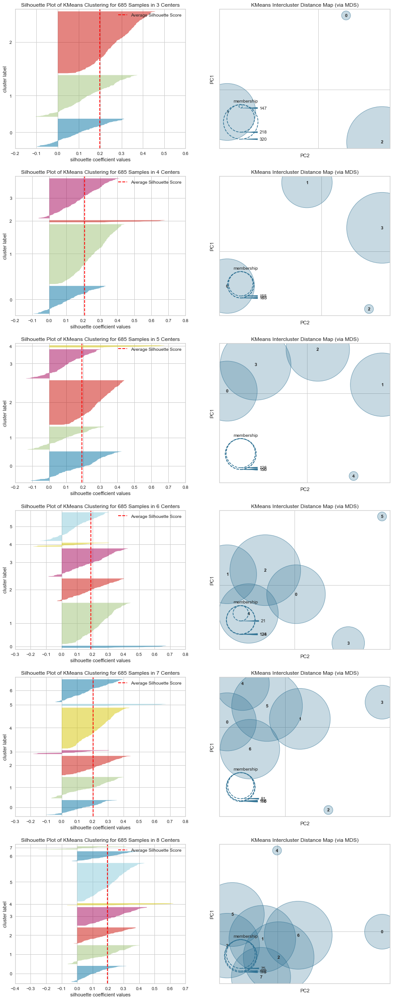

In [231]:
k = list(range(3,9))
plt.figure(figsize=(5,6))
generate_kmeans_SV_ICD_plots(winePCA, k)

In [9]:
# Kmeans HeartDataset
# setting number of cluster to 5. overfits and 3 works
n_clusters=7
kmeans = KMeans(
    init='k-means++',
    algorithm='auto',
    n_clusters=n_clusters,
    max_iter=1000,
    random_state=1,  # selecting random_state=1 for reproducibility
    verbose=0).fit(winePCA)

# using prediction to create a dataframe
clusters = kmeans.predict(winePCA)
cluster_df = pd.DataFrame(winePCA).copy()
cluster_df['Clusters'] = clusters
cluster_df

# distribution of classes (%)
(cluster_df.Clusters.value_counts(1)*100).round(2)



3    32.70
5    18.25
6    17.08
2    15.47
1    11.82
4     3.07
0     1.61
Name: Clusters, dtype: float64

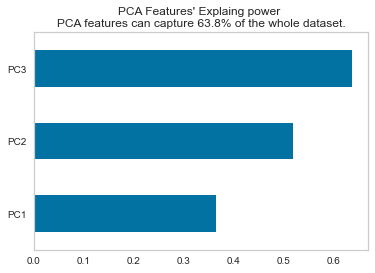

In [10]:
pca = PCA(n_components=3)
pc_feature_names = [f"PC{x}" for x in range(1, pca.n_components + 1)]
pca_data = pca.fit_transform(cluster_df)
pca_df = pd.DataFrame(pca_data, columns=pc_feature_names)
pd.Series(pca.explained_variance_ratio_.cumsum(), index=pc_feature_names).plot(
    kind='barh',
    title=
    f"""PCA Features' Explaing power \nPCA features can capture {((pca.explained_variance_ratio_.cumsum()[-1])*100).round(2)}% of the whole dataset."""
)
plt.grid()
plt.show()
wine_pca_kmeans= pca_df
pca_df['Clusters'] = clusters.astype('str')
fig = px.scatter_3d(pca_df,
                    x='PC1',
                    y='PC2',
                    z='PC3',
                    color='Clusters',
                    title='Cluster visualization with the help of PCA',
                    template='plotly_dark')
fig.update_traces(marker=dict(size=2))
fig.update_layout(width=700, height=500, bargap=0.05)
fig.show()

In [11]:
print( '------ Baseline Dummy -----')
dummy_NN_f1Score_train(XW_train, yW_train)
print( '------ Wine PCA K-means Dummy -----')
dummy_NN_f1Score_train(wine_pca_kmeans, yW_train)

------ Baseline Dummy -----
Train Time: 0.511 seconds
Test Time: 0.002 seconds
f1_micro Score of NN is 74.01%
------ Wine PCA K-means Dummy -----
Train Time: 0.455 seconds
Test Time: 0.002 seconds
f1_micro Score of NN is 64.38%


In [13]:
# Kmeans WineDataset
km_7 = KMeans(n_clusters=7,
                    init="k-means++",
                    random_state=42).fit(winePCA)

km_7_pred = km_7.predict(winePCA)
print("Adjusted Rand Score:     ", adjusted_rand_score(km_7_pred, yW_train.values.ravel()))
print("Homogeneity Score:       ", homogeneity_score(km_7_pred, yW_train.values.ravel()))
print("accuracy Score:       ", accuracy_score(km_7_pred, yW_train.values.ravel()))
print("adjusted_mutual_info Score:       ", adjusted_mutual_info_score(km_7_pred, yW_train.values.ravel()))
print("Calinski Harabasz Score: ", calinski_harabasz_score(winePCA, km_7_pred))

Adjusted Rand Score:      0.07245183772502718
Homogeneity Score:        0.0790223858134015
accuracy Score:        0.1416058394160584
adjusted_mutual_info Score:        0.0931932845354437
Calinski Harabasz Score:  125.81598700150165


-------------- EM -----------


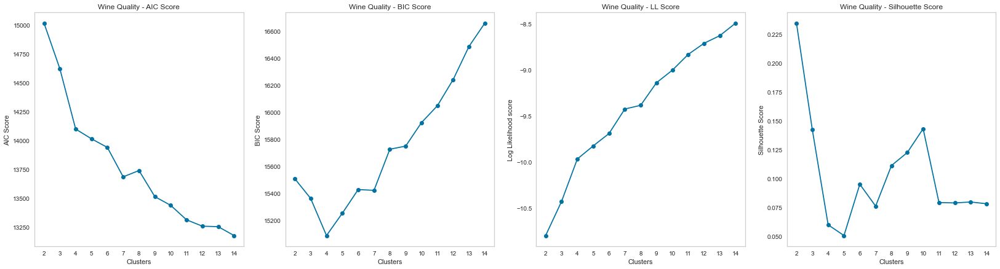

In [14]:
print("-------------- EM -----------")
em_k_selection_plot('Wine Quality', winePCA)

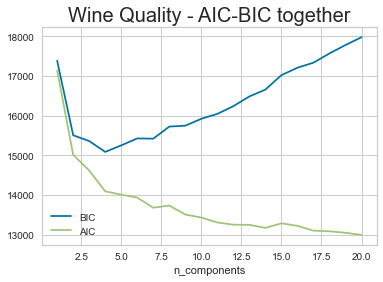

In [15]:
em_k_selection_plot_2('Wine Quality', winePCA)

In [20]:
# EM HeartDataset
# setting number of cluster to 5. overfits and 3 works
n_c=6
gmm_h_pred = GaussianMixture(n_components=n_c,
                              n_init=2,
                              tol=1e-3,
                              max_iter=1000, random_state=42).fit(winePCA)
clusters = gmm_h_pred.predict(winePCA)

cluster_df = pd.DataFrame(winePCA).copy()
cluster_df['Clusters'] = clusters
cluster_df

# distribution of classes (%)
(cluster_df.Clusters.value_counts(1)*100).round(2)

1    32.55
4    29.05
5    18.83
3    11.24
0     4.38
2     3.94
Name: Clusters, dtype: float64

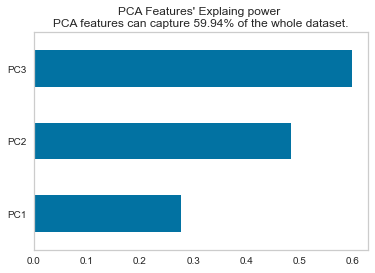

In [21]:
pca = PCA(n_components=3)
pc_feature_names = [f"PC{x}" for x in range(1, pca.n_components + 1)]
pca_data = pca.fit_transform(cluster_df)
pca_df = pd.DataFrame(pca_data, columns=pc_feature_names)
pd.Series(pca.explained_variance_ratio_.cumsum(), index=pc_feature_names).plot(
    kind='barh',
    title=
    f"""PCA Features' Explaing power \nPCA features can capture {((pca.explained_variance_ratio_.cumsum()[-1])*100).round(2)}% of the whole dataset."""
)
plt.grid()
plt.show()
wine_pca_em= pca_df
pca_df['Clusters'] = clusters.astype('str')
fig = px.scatter_3d(pca_df,
                    x='PC1',
                    y='PC2',
                    z='PC3',
                    color='Clusters',
                    title='Cluster visualization with the help of PCA',
                    template='plotly_dark')
fig.update_traces(marker=dict(size=2))
fig.update_layout(width=700, height=500, bargap=0.05)
fig.show()

In [250]:
print( '------ Baseline Dummy -----')
dummy_NN_f1Score_train(XW_train, yW_train)
print( '------ Wine PCA K-means Dummy -----')
dummy_NN_f1Score_train(wine_pca_em, yW_train)

------ Baseline Dummy -----
Train Time: 0.550 seconds
Test Time: 0.002 seconds
f1_micro Score of NN is 74.01%
------ Wine PCA K-means Dummy -----
Train Time: 0.504 seconds
Test Time: 0.002 seconds
f1_micro Score of NN is 63.65%


In [263]:
# EM WineDataset
gmm_w_pred = GaussianMixture(n_components=6,
                              n_init=2,
                              tol=1e-3,
                              max_iter=1000, random_state=42).fit(winePCA)
gmm_w_pred_vals = gmm_w_pred.predict(winePCA)

print("Adjusted Rand Score      ", adjusted_rand_score(gmm_w_pred_vals, yW_train.values.ravel()))
print("Homogeneity Score:       ", homogeneity_score(gmm_w_pred_vals, yW_train.values.ravel()))
print("accuracy Score:       ", accuracy_score(gmm_w_pred_vals, yW_train.values.ravel()))
print("adjusted_mutual_info Score:       ", adjusted_mutual_info_score(gmm_w_pred_vals, yW_train.values.ravel()))
print("Calinski Harabasz Score: ", calinski_harabasz_score(winePCA, gmm_w_pred_vals))

Adjusted Rand Score       0.08048368071288907
Homogeneity Score:        0.08082603325027408
accuracy Score:        0.11678832116788321
adjusted_mutual_info Score:        0.09289296989084712
Calinski Harabasz Score:  68.36566717129286


<p> Wine PCA, KNN = 7, EM= 6 </p>

-------------- Wine ICA -----------
-------------- K-Means -----------


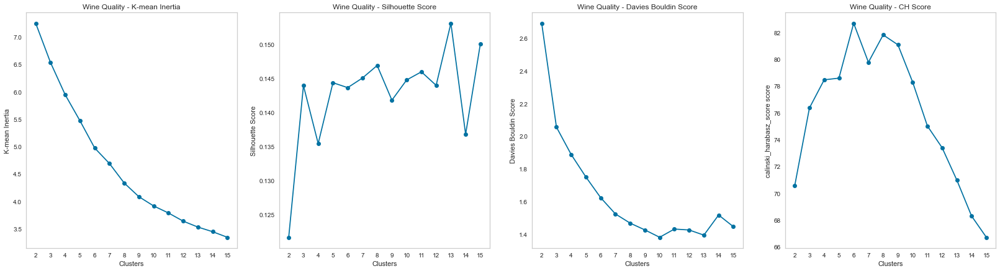

Number of estimated clusters for Wine Quality: 8


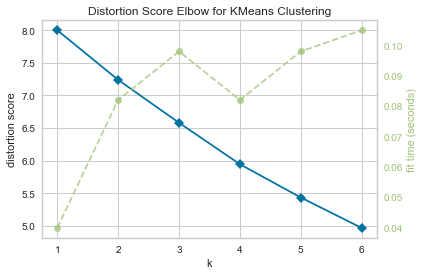

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [29]:
print("-------------- Wine ICA -----------")
print("-------------- K-Means -----------")
kmeans_k_selection_plots('Wine Quality', wineICA)

meanshift_cluster('Wine Quality', wineICA)

# Instantiate the clustering model and visualizer
model = KMeans()
visualizer = KElbowVisualizer(model, k=(1,7))

visualizer.fit(wineICA)        # Fit the data to the visualizer
visualizer.show() 


<Figure size 360x432 with 0 Axes>

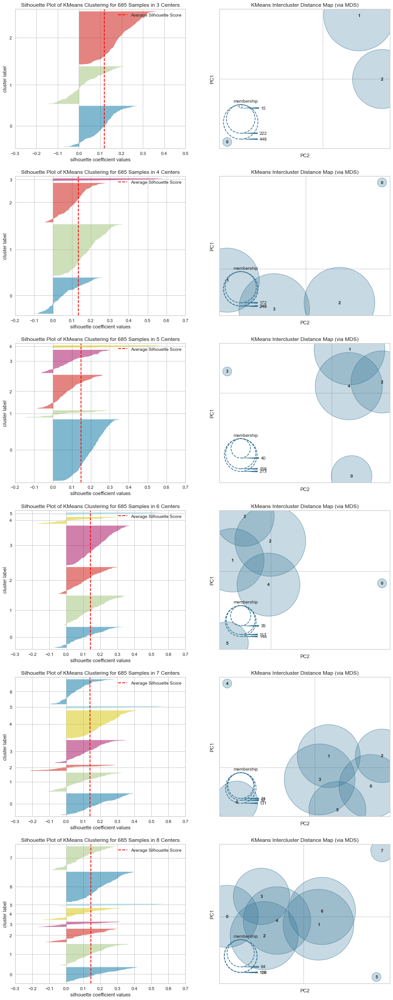

In [23]:
k = list(range(3,9))
plt.figure(figsize=(5,6))
generate_kmeans_SV_ICD_plots(wineICA, k)

In [24]:
# Kmeans HeartDataset
# setting number of cluster to 5. overfits and 3 works
n_clusters=6
kmeans = KMeans(
    init='k-means++',
    algorithm='auto',
    n_clusters=n_clusters,
    max_iter=1000,
    random_state=1,  # selecting random_state=1 for reproducibility
    verbose=0).fit(wineICA)

# using prediction to create a dataframe
clusters = kmeans.predict(wineICA)
cluster_df = pd.DataFrame(wineICA).copy()
cluster_df['Clusters'] = clusters
cluster_df

# distribution of classes (%)
(cluster_df.Clusters.value_counts(1)*100).round(2)

1    33.58
4    23.07
0    21.31
2    17.96
3     2.19
5     1.90
Name: Clusters, dtype: float64

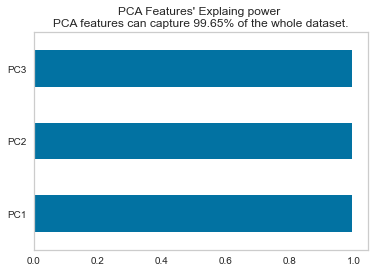

In [25]:
pca = PCA(n_components=3)
pc_feature_names = [f"PC{x}" for x in range(1, pca.n_components + 1)]
pca_data = pca.fit_transform(cluster_df)
pca_df = pd.DataFrame(pca_data, columns=pc_feature_names)
pd.Series(pca.explained_variance_ratio_.cumsum(), index=pc_feature_names).plot(
    kind='barh',
    title=
    f"""PCA Features' Explaing power \nPCA features can capture {((pca.explained_variance_ratio_.cumsum()[-1])*100).round(2)}% of the whole dataset."""
)
plt.grid()
plt.show()
wine_ica_kmeans= pca_df
pca_df['Clusters'] = clusters.astype('str')
fig = px.scatter_3d(pca_df,
                    x='PC1',
                    y='PC2',
                    z='PC3',
                    color='Clusters',
                    title='Cluster visualization with the help of ICA',
                    template='plotly_dark')
fig.update_traces(marker=dict(size=2))
fig.update_layout(width=700, height=500, bargap=0.05)
fig.show()

In [30]:
print( '------ Baseline Dummy -----')
dummy_NN_f1Score_train(XW_train, yW_train)
print( '------ Wine ICA K-means Dummy -----')
dummy_NN_f1Score_train(wine_ica_kmeans, yW_train)

------ Baseline Dummy -----
Train Time: 0.524 seconds
Test Time: 0.002 seconds
f1_micro Score of NN is 74.01%
------ Wine ICA K-means Dummy -----
Train Time: 0.407 seconds
Test Time: 0.002 seconds
f1_micro Score of NN is 56.50%


In [31]:
# Kmeans WineDataset
km_7 = KMeans(n_clusters=6,
                    init="k-means++",
                    random_state=42).fit(wineICA)

km_7_pred = km_7.predict(wineICA)
print("Adjusted Rand Score:     ", adjusted_rand_score(km_7_pred, yW_train.values.ravel()))
print("Homogeneity Score:       ", homogeneity_score(km_7_pred, yW_train.values.ravel()))
print("accuracy Score:       ", accuracy_score(km_7_pred, yW_train.values.ravel()))
print("adjusted_mutual_info Score:       ", adjusted_mutual_info_score(km_7_pred, yW_train.values.ravel()))
print("Calinski Harabasz Score: ", calinski_harabasz_score(wineICA, km_7_pred))

Adjusted Rand Score:      0.07468449552289892
Homogeneity Score:        0.08082998014175073
accuracy Score:        0.27445255474452557
adjusted_mutual_info Score:        0.09347910555864082
Calinski Harabasz Score:  82.68240473507636


-------------- EM -----------


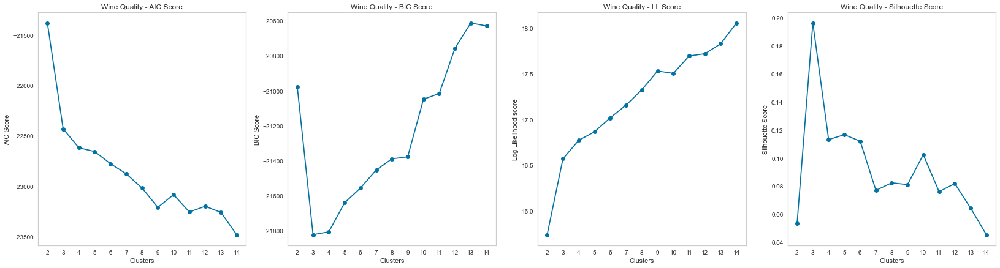

In [32]:
print("-------------- EM -----------")
em_k_selection_plot('Wine Quality', wineICA)

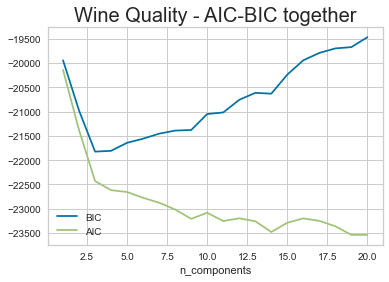

In [33]:
em_k_selection_plot_2('Wine Quality', wineICA)

In [41]:
# EM HeartDataset
# setting number of cluster to 5. overfits and 3 works
n_c=5
gmm_h_pred = GaussianMixture(n_components=n_c,
                              n_init=2,
                              tol=1e-3,
                              max_iter=1000, random_state=42).fit(wineICA)
clusters = gmm_h_pred.predict(wineICA)

cluster_df = pd.DataFrame(wineICA).copy()
cluster_df['Clusters'] = clusters
cluster_df

# distribution of classes (%)
(cluster_df.Clusters.value_counts(1)*100).round(2)

2    44.38
1    26.86
0    15.91
4     7.01
3     5.84
Name: Clusters, dtype: float64

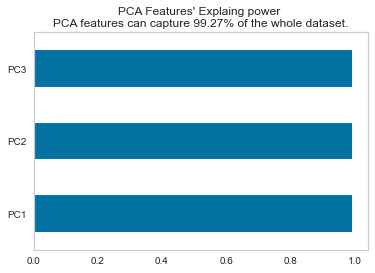

In [42]:
pca = PCA(n_components=3)
pc_feature_names = [f"PC{x}" for x in range(1, pca.n_components + 1)]
pca_data = pca.fit_transform(cluster_df)
pca_df = pd.DataFrame(pca_data, columns=pc_feature_names)
pd.Series(pca.explained_variance_ratio_.cumsum(), index=pc_feature_names).plot(
    kind='barh',
    title=
    f"""PCA Features' Explaing power \nPCA features can capture {((pca.explained_variance_ratio_.cumsum()[-1])*100).round(2)}% of the whole dataset."""
)
plt.grid()
plt.show()
wine_ica_em= pca_df
pca_df['Clusters'] = clusters.astype('str')
fig = px.scatter_3d(pca_df,
                    x='PC1',
                    y='PC2',
                    z='PC3',
                    color='Clusters',
                    title='Cluster visualization with the help of PCA',
                    template='plotly_dark')
fig.update_traces(marker=dict(size=2))
fig.update_layout(width=700, height=500, bargap=0.05)
fig.show()

In [43]:
print( '------ Baseline Dummy -----')
dummy_NN_f1Score_train(XW_train, yW_train)
print( '------ Wine ICA EM Dummy -----')
dummy_NN_f1Score_train(wine_ica_em, yW_train)

------ Baseline Dummy -----
Train Time: 0.511 seconds
Test Time: 0.003 seconds
f1_micro Score of NN is 74.01%
------ Wine ICA EM Dummy -----
Train Time: 0.413 seconds
Test Time: 0.003 seconds
f1_micro Score of NN is 57.23%


In [44]:
# EM WineDataset
gmm_w_pred = GaussianMixture(n_components=5,
                              n_init=2,
                              tol=1e-3,
                              max_iter=1000, random_state=42).fit(wineICA)
gmm_w_pred_vals = gmm_w_pred.predict(wineICA)

print("Adjusted Rand Score      ", adjusted_rand_score(gmm_w_pred_vals, yW_train.values.ravel()))
print("Homogeneity Score:       ", homogeneity_score(gmm_w_pred_vals, yW_train.values.ravel()))
print("accuracy Score:       ", accuracy_score(gmm_w_pred_vals, yW_train.values.ravel()))
print("adjusted_mutual_info Score:       ", adjusted_mutual_info_score(gmm_w_pred_vals, yW_train.values.ravel()))
print("Calinski Harabasz Score: ", calinski_harabasz_score(wineICA, gmm_w_pred_vals))

Adjusted Rand Score       0.10835682686878603
Homogeneity Score:        0.09067405236154602
accuracy Score:        0.181021897810219
adjusted_mutual_info Score:        0.09988362899314088
Calinski Harabasz Score:  56.28528718549882


<p> Wine ICA, KNN = 6, EM= 5 </p>

<h1> RCA Wine Quality Clustering</h1>

-------------- Wine RP -----------
-------------- K-Means -----------


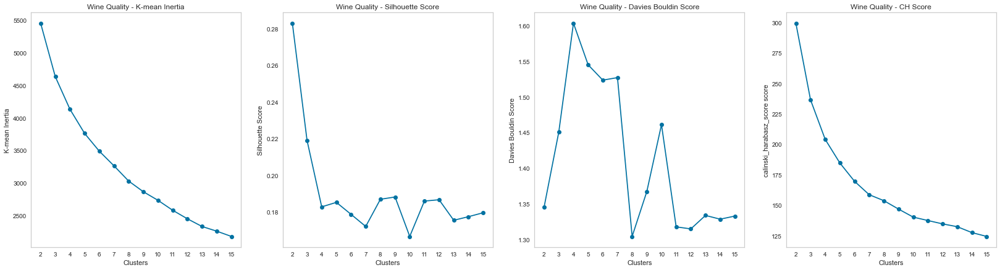

Number of estimated clusters for Wine Quality: 6


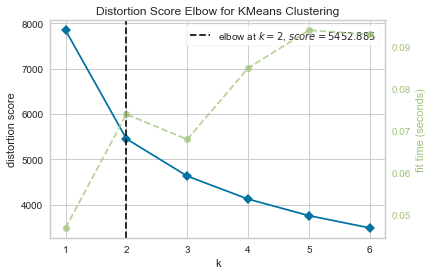

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [47]:
print("-------------- Wine RP -----------")
print("-------------- K-Means -----------")
kmeans_k_selection_plots('Wine Quality', wineRP)

meanshift_cluster('Wine Quality', wineRP)

# Instantiate the clustering model and visualizer
model = KMeans()
visualizer = KElbowVisualizer(model, k=(1,7))

visualizer.fit(wineRP)        # Fit the data to the visualizer
visualizer.show() 


<Figure size 360x432 with 0 Axes>

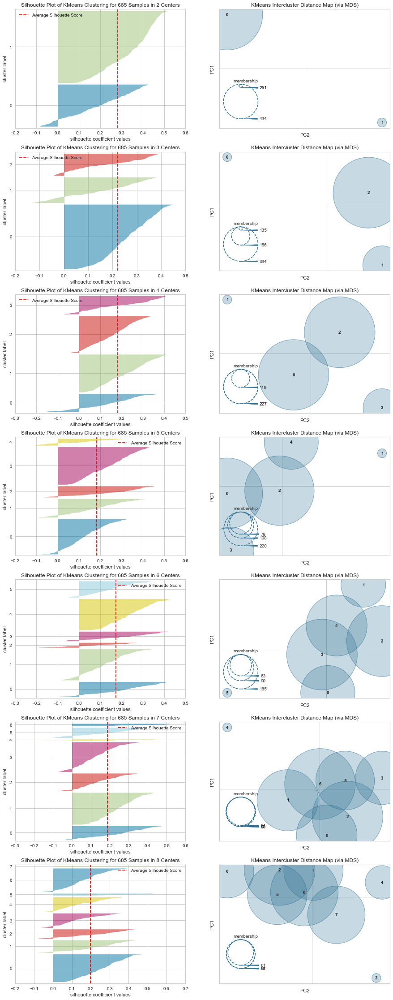

In [46]:
k = list(range(2,9))
plt.figure(figsize=(5,6))
generate_kmeans_SV_ICD_plots(wineRP, k)

In [73]:
# Kmeans HeartDataset
# setting number of cluster to 5. overfits and 3 works
n_clusters=3
kmeans = KMeans(
    init='k-means++',
    algorithm='auto',
    n_clusters=n_clusters,
    max_iter=1000,
    random_state=1,  # selecting random_state=1 for reproducibility
    verbose=0).fit(wineRP)

# using prediction to create a dataframe
clusters = kmeans.predict(wineRP)
cluster_df = pd.DataFrame(wineRP).copy()
cluster_df['Clusters'] = clusters
cluster_df

# distribution of classes (%)
(cluster_df.Clusters.value_counts(1)*100).round(2)

2    57.52
0    22.77
1    19.71
Name: Clusters, dtype: float64

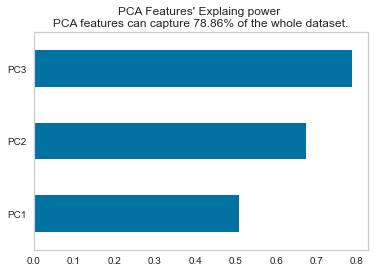

In [74]:
pca = PCA(n_components=3)
pc_feature_names = [f"PC{x}" for x in range(1, pca.n_components + 1)]
pca_data = pca.fit_transform(cluster_df)
pca_df = pd.DataFrame(pca_data, columns=pc_feature_names)
pd.Series(pca.explained_variance_ratio_.cumsum(), index=pc_feature_names).plot(
    kind='barh',
    title=
    f"""PCA Features' Explaing power \nPCA features can capture {((pca.explained_variance_ratio_.cumsum()[-1])*100).round(2)}% of the whole dataset."""
)
plt.grid()
plt.show()
wine_rca_kmeans= pca_df
pca_df['Clusters'] = clusters.astype('str')
fig = px.scatter_3d(pca_df,
                    x='PC1',
                    y='PC2',
                    z='PC3',
                    color='Clusters',
                    title='Cluster visualization with the help of PCA',
                    template='plotly_dark')
fig.update_traces(marker=dict(size=2))
fig.update_layout(width=700, height=500, bargap=0.05)
fig.show()

In [56]:
print( '------ Baseline Dummy -----')
dummy_NN_f1Score_train(XW_train, yW_train)
print( '------ Wine RCA K-means Dummy -----')
dummy_NN_f1Score_train(wine_rca_kmeans, yW_train)

------ Baseline Dummy -----
Train Time: 0.513 seconds
Test Time: 0.002 seconds
f1_micro Score of NN is 74.01%
------ Wine RCA K-means Dummy -----
Train Time: 0.475 seconds
Test Time: 0.002 seconds
f1_micro Score of NN is 62.92%


In [57]:
# Kmeans WineDataset
km_7 = KMeans(n_clusters=3,
                    init="k-means++",
                    random_state=42).fit(wineRP)

km_7_pred = km_7.predict(wineRP)
print("Adjusted Rand Score:     ", adjusted_rand_score(km_7_pred, yW_train.values.ravel()))
print("Homogeneity Score:       ", homogeneity_score(km_7_pred, yW_train.values.ravel()))
print("accuracy Score:       ", accuracy_score(km_7_pred, yW_train.values.ravel()))
print("adjusted_mutual_info Score:       ", adjusted_mutual_info_score(km_7_pred, yW_train.values.ravel()))
print("Calinski Harabasz Score: ", calinski_harabasz_score(wineRP, km_7_pred))

Adjusted Rand Score:      0.05710122265446295
Homogeneity Score:        0.03851055540321891
accuracy Score:        0.4481751824817518
adjusted_mutual_info Score:        0.035138370466922524
Calinski Harabasz Score:  236.4453562036417


-------------- EM -----------


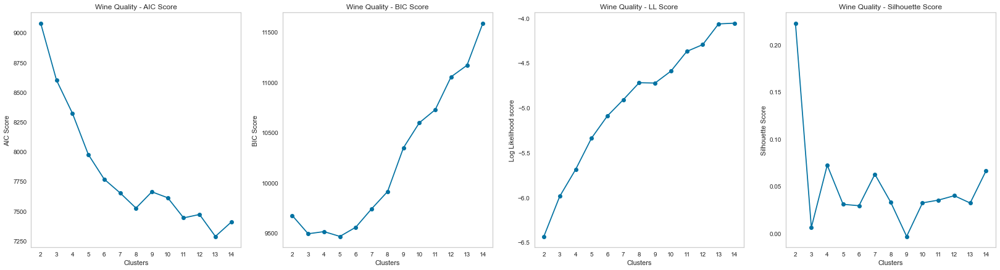

In [58]:
print("-------------- EM -----------")
em_k_selection_plot('Wine Quality', wineRP)

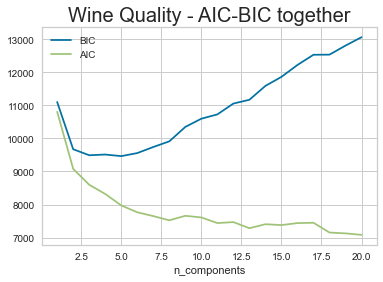

In [319]:
em_k_selection_plot_2('Wine Quality', wineRP)

In [63]:
# EM HeartDataset
# setting number of cluster to 5. overfits and 3 works
n_c=6
gmm_h_pred = GaussianMixture(n_components=n_c,
                              n_init=2,
                              tol=1e-3,
                              max_iter=1000, random_state=42).fit(wineRP)
clusters = gmm_h_pred.predict(wineRP)

cluster_df = pd.DataFrame(wineRP).copy()
cluster_df['Clusters'] = clusters
cluster_df

# distribution of classes (%)
(cluster_df.Clusters.value_counts(1)*100).round(2)

5    28.61
3    27.59
4    17.08
1    11.68
0     8.03
2     7.01
Name: Clusters, dtype: float64

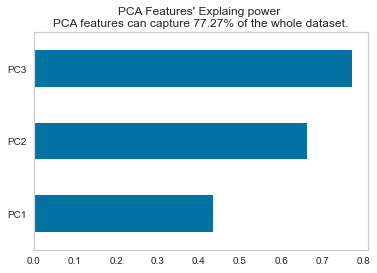

In [64]:
pca = PCA(n_components=3)
pc_feature_names = [f"PC{x}" for x in range(1, pca.n_components + 1)]
pca_data = pca.fit_transform(cluster_df)
pca_df = pd.DataFrame(pca_data, columns=pc_feature_names)
pd.Series(pca.explained_variance_ratio_.cumsum(), index=pc_feature_names).plot(
    kind='barh',
    title=
    f"""PCA Features' Explaing power \nPCA features can capture {((pca.explained_variance_ratio_.cumsum()[-1])*100).round(2)}% of the whole dataset."""
)
plt.grid()
plt.show()
wine_rca_em= pca_df
pca_df['Clusters'] = clusters.astype('str')
fig = px.scatter_3d(pca_df,
                    x='PC1',
                    y='PC2',
                    z='PC3',
                    color='Clusters',
                    title='Cluster visualization with the help of PCA',
                    template='plotly_dark')
fig.update_traces(marker=dict(size=2))
fig.update_layout(width=700, height=500, bargap=0.05)
fig.show()

In [65]:
print( '------ Baseline Dummy -----')
dummy_NN_f1Score_train(XW_train, yW_train)
print( '------ Wine ICA EM Dummy -----')
dummy_NN_f1Score_train(wine_rca_em, yW_train)

------ Baseline Dummy -----
Train Time: 0.511 seconds
Test Time: 0.002 seconds
f1_micro Score of NN is 74.01%
------ Wine ICA EM Dummy -----
Train Time: 0.459 seconds
Test Time: 0.003 seconds
f1_micro Score of NN is 59.42%


In [70]:
# EM WineDataset
gmm_w_pred = GaussianMixture(n_components=6,
                              n_init=2,
                              tol=1e-3,
                              max_iter=1000, random_state=42).fit(wineRP)
gmm_w_pred_vals = gmm_w_pred.predict(wineRP)

print("Adjusted Rand Score      ", adjusted_rand_score(gmm_w_pred_vals, yW_train.values.ravel()))
print("Homogeneity Score:       ", homogeneity_score(gmm_w_pred_vals, yW_train.values.ravel()))
print("accuracy Score:       ", accuracy_score(gmm_w_pred_vals, yW_train.values.ravel()))
print("adjusted_mutual_info Score:       ", adjusted_mutual_info_score(gmm_w_pred_vals, yW_train.values.ravel()))
print("Calinski Harabasz Score: ", calinski_harabasz_score(wineRP, gmm_w_pred_vals))

Adjusted Rand Score       0.05964749962316112
Homogeneity Score:        0.07575822949458491
accuracy Score:        0.09781021897810219
adjusted_mutual_info Score:        0.08933777832465875
Calinski Harabasz Score:  66.3896850317499


<p> Wine RP, KNN = 3, EM= 6 </p>

<h1> ETC Wine Quality Clustering</h1>

-------------- Wine ETC -----------
-------------- K-Means -----------


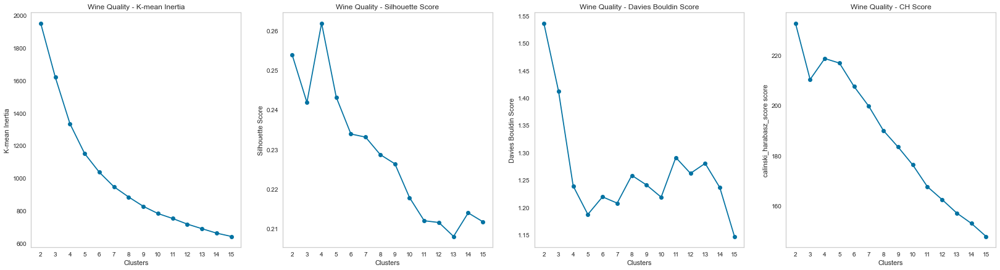

Number of estimated clusters for Wine Quality: 3


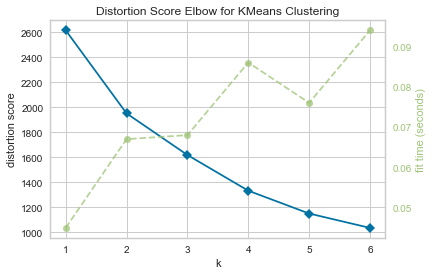

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [75]:
print("-------------- Wine ETC -----------")
print("-------------- K-Means -----------")
kmeans_k_selection_plots('Wine Quality', wineET)


meanshift_cluster('Wine Quality', wineET)

# Instantiate the clustering model and visualizer
model = KMeans()
visualizer = KElbowVisualizer(model, k=(1,7))

visualizer.fit(wineET)        # Fit the data to the visualizer
visualizer.show() 

<Figure size 360x432 with 0 Axes>

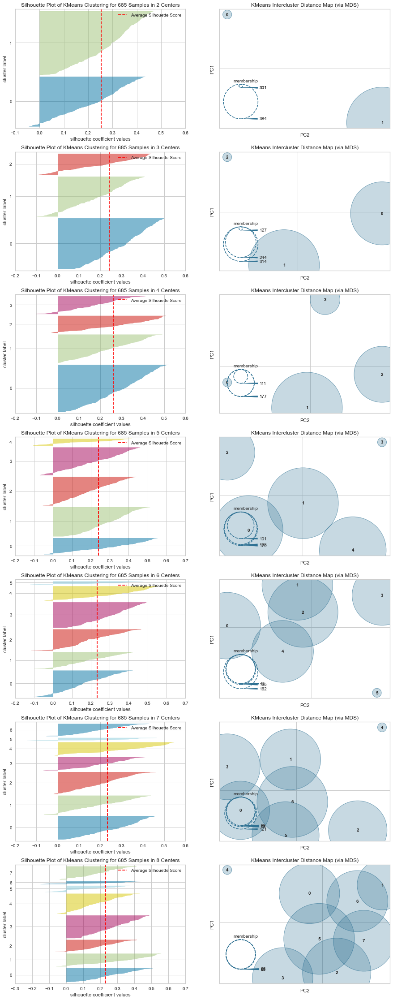

In [80]:
k = list(range(2,9))
plt.figure(figsize=(5,6))
generate_kmeans_SV_ICD_plots(wineET, k)

In [78]:
# Kmeans HeartDataset
# setting number of cluster to 5. overfits and 3 works
n_clusters=4
kmeans = KMeans(
    init='k-means++',
    algorithm='auto',
    n_clusters=n_clusters,
    max_iter=1000,
    random_state=1,  # selecting random_state=1 for reproducibility
    verbose=0).fit(wineET)

# using prediction to create a dataframe
clusters = kmeans.predict(wineET)
cluster_df = pd.DataFrame(wineET).copy()
cluster_df['Clusters'] = clusters
cluster_df

# distribution of classes (%)
(cluster_df.Clusters.value_counts(1)*100).round(2)

1    42.34
0    25.84
3    16.35
2    15.47
Name: Clusters, dtype: float64

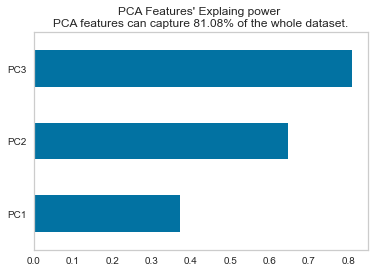

In [79]:
pca = PCA(n_components=3)
pc_feature_names = [f"PC{x}" for x in range(1, pca.n_components + 1)]
pca_data = pca.fit_transform(cluster_df)
pca_df = pd.DataFrame(pca_data, columns=pc_feature_names)
pd.Series(pca.explained_variance_ratio_.cumsum(), index=pc_feature_names).plot(
    kind='barh',
    title=
    f"""PCA Features' Explaing power \nPCA features can capture {((pca.explained_variance_ratio_.cumsum()[-1])*100).round(2)}% of the whole dataset."""
)
plt.grid()
plt.show()
wine_etc_kmeans= pca_df
pca_df['Clusters'] = clusters.astype('str')
fig = px.scatter_3d(pca_df,
                    x='PC1',
                    y='PC2',
                    z='PC3',
                    color='Clusters',
                    title='Cluster visualization with the help of PCA',
                    template='plotly_dark')
fig.update_traces(marker=dict(size=2))
fig.update_layout(width=700, height=500, bargap=0.05)
fig.show()

In [80]:
print( '------ Baseline Dummy -----')
dummy_NN_f1Score_train(XW_train, yW_train)
print( '------ Wine ICA K-means Dummy -----')
dummy_NN_f1Score_train(wine_etc_kmeans, yW_train)

------ Baseline Dummy -----
Train Time: 0.518 seconds
Test Time: 0.002 seconds
f1_micro Score of NN is 74.01%
------ Wine ICA K-means Dummy -----
Train Time: 0.462 seconds
Test Time: 0.002 seconds
f1_micro Score of NN is 65.99%


In [82]:
# Kmeans WineDataset
km_7 = KMeans(n_clusters=4,
                    init="k-means++",
                    random_state=42).fit(wineET)

km_7_pred = km_7.predict(wineET)
print("Adjusted Rand Score:     ", adjusted_rand_score(km_7_pred, yW_train.values.ravel()))
print("Homogeneity Score:       ", homogeneity_score(km_7_pred, yW_train.values.ravel()))
print("accuracy Score:       ", accuracy_score(km_7_pred, yW_train.values.ravel()))
print("adjusted_mutual_info Score:       ", adjusted_mutual_info_score(km_7_pred, yW_train.values.ravel()))
print("Calinski Harabasz Score: ", calinski_harabasz_score(wineET, km_7_pred))

Adjusted Rand Score:      0.1192087574346796
Homogeneity Score:        0.13775164034242968
accuracy Score:        0.21751824817518248
adjusted_mutual_info Score:        0.15224661783181978
Calinski Harabasz Score:  218.71998569829813


-------------- EM -----------


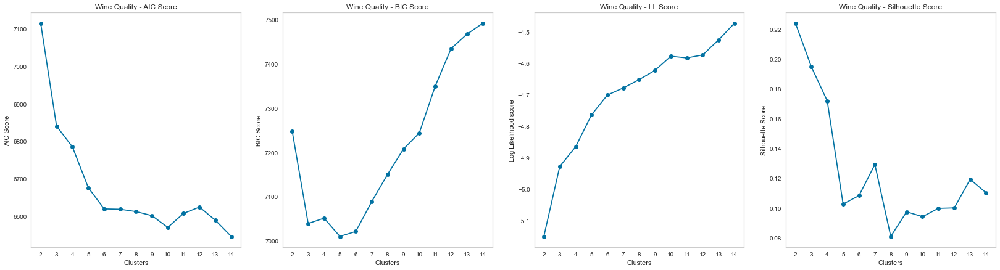

In [83]:
print("-------------- EM -----------")
em_k_selection_plot('Wine Quality', wineET)

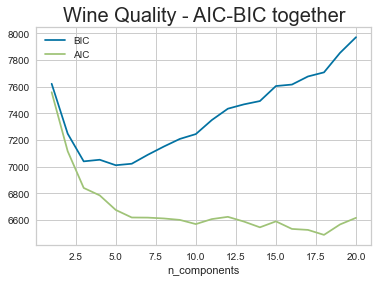

In [84]:
em_k_selection_plot_2('Wine Quality', wineET)

In [89]:
# EM HeartDataset
# setting number of cluster to 5. overfits and 3 works
n_c=4
gmm_h_pred = GaussianMixture(n_components=n_c,
                              n_init=2,
                              tol=1e-3,
                              max_iter=1000, random_state=42).fit(wineET)
clusters = gmm_h_pred.predict(wineET)

cluster_df = pd.DataFrame(wineET).copy()
cluster_df['Clusters'] = clusters
cluster_df

# distribution of classes (%)
(cluster_df.Clusters.value_counts(1)*100).round(2)

3    36.79
1    32.99
2    22.63
0     7.59
Name: Clusters, dtype: float64

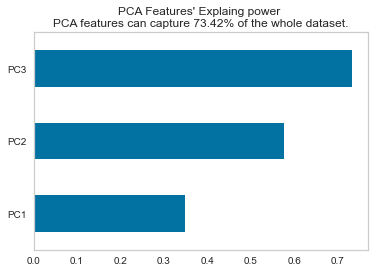

In [90]:
pca = PCA(n_components=3)
pc_feature_names = [f"PC{x}" for x in range(1, pca.n_components + 1)]
pca_data = pca.fit_transform(cluster_df)
pca_df = pd.DataFrame(pca_data, columns=pc_feature_names)
pd.Series(pca.explained_variance_ratio_.cumsum(), index=pc_feature_names).plot(
    kind='barh',
    title=
    f"""PCA Features' Explaing power \nPCA features can capture {((pca.explained_variance_ratio_.cumsum()[-1])*100).round(2)}% of the whole dataset."""
)
plt.grid()
plt.show()
wine_etc_em= pca_df
pca_df['Clusters'] = clusters.astype('str')
fig = px.scatter_3d(pca_df,
                    x='PC1',
                    y='PC2',
                    z='PC3',
                    color='Clusters',
                    title='Cluster visualization with the help of PCA',
                    template='plotly_dark')
fig.update_traces(marker=dict(size=2))
fig.update_layout(width=700, height=500, bargap=0.05)
fig.show()

In [91]:
print( '------ Baseline Dummy -----')
dummy_NN_f1Score_train(XW_train, yW_train)
print( '------ Wine ICA EM Dummy -----')
dummy_NN_f1Score_train(wine_etc_em, yW_train)

------ Baseline Dummy -----
Train Time: 0.524 seconds
Test Time: 0.002 seconds
f1_micro Score of NN is 74.01%
------ Wine ICA EM Dummy -----
Train Time: 0.457 seconds
Test Time: 0.002 seconds
f1_micro Score of NN is 66.72%


In [93]:
# EM WineDataset
gmm_w_pred = GaussianMixture(n_components=4,
                              n_init=2,
                              tol=1e-3,
                              max_iter=1000, random_state=42).fit(wineET)
gmm_w_pred_vals = gmm_w_pred.predict(wineET)

print("Adjusted Rand Score      ", adjusted_rand_score(gmm_w_pred_vals, yW_train.values.ravel()))
print("Homogeneity Score:       ", homogeneity_score(gmm_w_pred_vals, yW_train.values.ravel()))
print("accuracy Score:       ", accuracy_score(gmm_w_pred_vals, yW_train.values.ravel()))
print("adjusted_mutual_info Score:       ", adjusted_mutual_info_score(gmm_w_pred_vals, yW_train.values.ravel()))
print("Calinski Harabasz Score: ", calinski_harabasz_score(wineET, gmm_w_pred_vals))

Adjusted Rand Score       0.1191686915740276
Homogeneity Score:        0.15239887116538683
accuracy Score:        0.18686131386861313
adjusted_mutual_info Score:        0.16695140276578777
Calinski Harabasz Score:  141.0736453995474


<p> Wine ETC, KNN = 4, EM= 4 </p>

<p> Wine PCA, KNN = 7, EM= 6 </p>
<p> Wine ICA, KNN = 6, EM= 5 </p>
<p> Wine RP, KNN = 3, EM= 6 </p>
<p> Wine ETC, KNN = 4, EM= 4 </p>

In [119]:
# Create k-means benchmark table
# print_line('K-Means Wine Benchmark')
print('init\t\ttime\tinertia\thomog\tcompl\tv-meas\tARI\tAMI\tsilhouette')
print(85*'_')
bench_kmeans(KMeans(init='k-means++', n_clusters=7), labels=yW_train, name="Original",  data=XW_train)
bench_kmeans(KMeans(init='k-means++', n_clusters=4), labels=yW_train, name="PCA-based", data=winePCA)
bench_kmeans(KMeans(init='k-means++', n_clusters=6), labels=yW_train, name="ICA-based", data=wineICA)
bench_kmeans(KMeans(init='k-means++', n_clusters=3), labels=yW_train, name="RP-based",  data=wineRP)
bench_kmeans(KMeans(init='k-means++', n_clusters=4), labels=yW_train, name="ETC-based", data=wineET)
# Create EM benchmark table
# print_line('EM Wine Benchmark')
print('init\t\ttime\taic\tbic\thomog\tcompl\tv-meas\tARI\tAMI\tsilhouette')
print(85*'_')
bench_em(GaussianMixture(n_components=6, random_state=33), labels=yW_train, name="Original",  data=XW_train)
bench_em(GaussianMixture(n_components=4, random_state=33), labels=yW_train, name="PCA-based", data=winePCA)
bench_em(GaussianMixture(n_components=5, random_state=33), labels=yW_train, name="ICA-based", data=wineICA)
bench_em(GaussianMixture(n_components=6, random_state=33), labels=yW_train, name="RP-based",  data=wineRP)
bench_em(GaussianMixture(n_components=4, random_state=33), labels=yW_train, name="ETC-based", data=wineET)

init		time	inertia	homog	compl	v-meas	ARI	AMI	silhouette
_____________________________________________________________________________________
Original 	0.12s	3626	0.136	0.081	0.101	0.074	0.095	0.196
PCA-based	0.07s	4701	0.127	0.096	0.109	0.084	0.106	0.189
ICA-based	0.09s	4	0.128	0.082	0.100	0.075	0.094	0.145
RP-based 	0.07s	4631	0.038	0.039	0.038	0.057	0.035	0.219
ETC-based	0.08s	1332	0.179	0.138	0.156	0.119	0.153	0.262
init		time	aic	bic	homog	compl	v-meas	ARI	AMI	silhouette
_____________________________________________________________________________________
Original 	0.12s	14260	16375	0.118	0.075	0.092	0.068	0.087	0.083
PCA-based	0.12s	14085	15077	0.091	0.078	0.084	0.066	0.080	0.061
ICA-based	0.10s	-22922	-21907	0.130	0.093	0.109	0.113	0.104	0.087
RP-based 	0.12s	7877	9666	0.121	0.072	0.090	0.068	0.085	0.041
ETC-based	0.06s	6757	7024	0.193	0.152	0.170	0.119	0.167	0.155


In [120]:
# # Create k-means benchmark table
# # print_line('K-Means Wine Benchmark')
# print('init\t\ttime\tinertia\thomog\tcompl\tv-meas\tARI\tAMI\tsilhouette')
# print(85*'_')
# bench_kmeans(KMeans(init='k-means++', n_clusters=7), labels=yW_train, name="Original",  data=XW_train)
# bench_kmeans(KMeans(init='k-means++', n_clusters=4), labels=yW_train, name="PCA-based", data=winePCA)
# bench_kmeans(KMeans(init='k-means++', n_clusters=3), labels=yW_train, name="ICA-based", data=wineICA)
# bench_kmeans(KMeans(init='k-means++', n_clusters=3), labels=yW_train, name="RP-based",  data=wineRP)
# bench_kmeans(KMeans(init='k-means++', n_clusters=3), labels=yW_train, name="ETC-based", data=wineET)
# # Create EM benchmark table
# # print_line('EM Wine Benchmark')
# print('init\t\ttime\taic\tbic\thomog\tcompl\tv-meas\tARI\tAMI\tsilhouette')
# print(85*'_')
# bench_em(GaussianMixture(n_components=6, random_state=33), labels=yW_train, name="Original",  data=XW_train)
# bench_em(GaussianMixture(n_components=6, random_state=33), labels=yW_train, name="PCA-based", data=winePCA)
# bench_em(GaussianMixture(n_components=5, random_state=33), labels=yW_train, name="ICA-based", data=wineICA)
# bench_em(GaussianMixture(n_components=6, random_state=33), labels=yW_train, name="RP-based",  data=wineRP)
# bench_em(GaussianMixture(n_components=4, random_state=33), labels=yW_train, name="ETC-based", data=wineET)

init		time	inertia	homog	compl	v-meas	ARI	AMI	silhouette
_____________________________________________________________________________________
Original 	0.11s	3625	0.135	0.080	0.100	0.074	0.094	0.196
PCA-based	0.08s	4701	0.129	0.097	0.111	0.085	0.108	0.189
ICA-based	0.08s	6	0.033	0.043	0.037	0.017	0.034	0.118
RP-based 	0.06s	4632	0.029	0.031	0.030	0.044	0.027	0.234
ETC-based	0.07s	1618	0.178	0.172	0.175	0.129	0.172	0.241
init		time	aic	bic	homog	compl	v-meas	ARI	AMI	silhouette
_____________________________________________________________________________________
Original 	0.12s	14260	16375	0.118	0.075	0.092	0.068	0.087	0.083
PCA-based	0.09s	13800	15290	0.119	0.076	0.093	0.064	0.087	0.073
ICA-based	0.10s	-22922	-21907	0.130	0.093	0.109	0.113	0.104	0.087
RP-based 	0.12s	7877	9666	0.121	0.072	0.090	0.068	0.085	0.041
ETC-based	0.05s	6757	7024	0.193	0.152	0.170	0.119	0.167	0.155


In [128]:

df2 = pd.DataFrame()
df2['init'] = ['Original','PCA-based','ICA-based','RP-based','ETC-based']
df2['time'] = [0.12,0.07,0.09,0.07,0.08]
df2['inertia'] = [3626,4701,4,4631,1332]
df2['homog'] = [0.136,0.127,0.128,0.038,0.179]
df2['compl'] = [0.081,0.096,0.082,0.039,0.138]
df2['v-mea'] = [0.101,0.109,0.1,0.038,0.156]
df2['ARI'] = [0.074,0.084,0.075,0.057,0.119]
df2['AMI'] = [0.095,0.106,0.094,0.035,0.153]
df2['silhouette'] = [0.196,0.189,0.145,0.219,0.262]
df2

cm = sns.light_palette('green', as_cmap='True')
s = df2.style.background_gradient(cmap=cm)
s

,init,time,inertia,homog,compl,v-mea,ARI,AMI,silhouette
0,Original,0.120000,3626,0.136000,0.081000,0.101000,0.074000,0.095000,0.196000
1,PCA-based,0.070000,4701,0.127000,0.096000,0.109000,0.084000,0.106000,0.189000
2,ICA-based,0.090000,4,0.128000,0.082000,0.100000,0.075000,0.094000,0.145000
3,RP-based,0.070000,4631,0.038000,0.039000,0.038000,0.057000,0.035000,0.219000
4,ETC-based,0.080000,1332,0.179000,0.138000,0.156000,0.119000,0.153000,0.262000


In [130]:
df2 = pd.DataFrame()
df2['init'] = ['Original','PCA-based','ICA-based','RP-based','ETC-based']
df2['time'] = [0.12,0.09,0.10,0.12,0.05]
df2['aic'] = [14260,13800,-22922,7877,6757]
df2['bic'] = [16375,15290,-21907,9666,7024]
df2['homog'] = [0.118,0.119,0.13,0.121,0.193]
df2['compl'] = [0.075,0.076,0.093,0.072,0.152]
df2['v-meas'] = [0.092,0.093,0.109,0.09,0.17]
df2['ARI'] = [0.068,0.064,0.113,0.068,0.119]
df2['AMI'] = [0.087,0.087,0.104,0.085,0.167]

cm = sns.light_palette('green', as_cmap='True')
s = df2.style.background_gradient(cmap=cm)
s

,init,time,aic,bic,homog,compl,v-meas,ARI,AMI
0,Original,0.120000,14260,16375,0.118000,0.075000,0.092000,0.068000,0.087000
1,PCA-based,0.090000,13800,15290,0.119000,0.076000,0.093000,0.064000,0.087000
2,ICA-based,0.100000,-22922,-21907,0.130000,0.093000,0.109000,0.113000,0.104000
3,RP-based,0.120000,7877,9666,0.121000,0.072000,0.090000,0.068000,0.085000
4,ETC-based,0.050000,6757,7024,0.193000,0.152000,0.170000,0.119000,0.167000
